<a href="https://colab.research.google.com/github/uddeshya-23/Telecom-churn-data-model/blob/main/Telecom_Churn_Case_study.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

In [504]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

pd.options.display.max_rows = 300
pd.options.display.max_columns = 300


#ML Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier


%matplotlib inline
from datetime import datetime as dt
from matplotlib.pyplot import xticks
from PIL import Image
RANDOM_STATE = 42
%matplotlib inline

# Metrics
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import precision_recall_curve
from sklearn import metrics
from sklearn.datasets import fetch_openml
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Scaling
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

#Balancing
from imblearn import under_sampling
from imblearn import over_sampling
from imblearn.over_sampling import SMOTE


import warnings
warnings.filterwarnings('ignore')

In [316]:
## READ CSV
telecom=pd.read_csv('/content/drive/MyDrive/Upgrad Data/telecom_churn_data (1).csv')
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [317]:
telecom.shape


(99999, 226)

In [318]:
# Missing data check
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False).round(2)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

In [319]:
print("Rows \t\t\t: ", telecom.shape[0])
print("Columns \t\t: ", telecom.shape[1])
print("\nFeatures \t\t: \n", telecom.columns.tolist())
print("\nMissing values  \t: ", telecom.isnull().sum().values.sum())
print("\nUnique values \t\t: \n", telecom.nunique())

Rows 			:  99999
Columns 		:  226

Features 		: 
 ['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_

In [320]:
# lets check the missing data
missing_data(telecom)

,Total,Percent
arpu_3g_6,74846,74.85
night_pck_user_6,74846,74.85
total_rech_data_6,74846,74.85
arpu_2g_6,74846,74.85
max_rech_data_6,74846,74.85
fb_user_6,74846,74.85
av_rech_amt_data_6,74846,74.85
date_of_last_rech_data_6,74846,74.85
count_rech_2g_6,74846,74.85
count_rech_3g_6,74846,74.85


In [321]:
# find out the missing values
percent = (telecom.isnull().sum()/telecom.isnull().count()*100).sort_values(ascending = False).round(2)
percent_1 = percent[percent > 0]
percent_1

arpu_3g_6                   74.85
night_pck_user_6            74.85
total_rech_data_6           74.85
arpu_2g_6                   74.85
max_rech_data_6             74.85
fb_user_6                   74.85
av_rech_amt_data_6          74.85
date_of_last_rech_data_6    74.85
count_rech_2g_6             74.85
count_rech_3g_6             74.85
date_of_last_rech_data_7    74.43
total_rech_data_7           74.43
fb_user_7                   74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
count_rech_2g_7             74.43
av_rech_amt_data_7          74.43
arpu_2g_7                   74.43
count_rech_3g_7             74.43
arpu_3g_7                   74.43
total_rech_data_9           74.08
count_rech_3g_9             74.08
fb_user_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
date_of_last_rech_data_9    74.08
night_pck_user_9            74.08
arpu_2g_9                   74.08
count_rech_2g_9             74.08
av_rech_amt_da

In [322]:
# number of coulmns with missing values
percent_1.shape

(166,)

In [323]:
# more than 70-75% missing values
percent_70 = percent[percent > 70]

# number of coulmns with more than 70-75% missing values
percent_70.shape

(40,)

1.There are 99999 rows and 226 columns
2.There are 3594931 missing values.
3.The data set has 166 (out of 226) columns with missing values
4.Among above 40 columns have more than 70% missing values
5.Various attributes with sufixes 6, 7, 8 and 9 which corresponds to months June , July, August and September respectively have missing values ~74%
6.Also each month data has same percent of missing values. Ex: All attributes with suffix 9 has 74.08% missing values

In [324]:
# Checking if all mobile numbers are unique thereby confirming all user entries are unique
telecom['mobile_number'].nunique()

99999



1.   The number of unique mobile numbers is equal to the total number of rows present in the dataset

2.   Hence mobile number can be used as a unique index to represent each customer/user



In [325]:
telecom.set_index('mobile_number', inplace = True)
telecom.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,N

In [326]:
# statistics
telecom.describe().round(2)

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.0,98981.0,98981.0,98981.0,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.0,96140.0,94621.0,92254.0,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,9

**DATA MANIPULATION**

In [327]:
# converting all blank cells to NA(null values)
telecom = telecom.replace(" ", np.nan)
telecom.head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,N

In [328]:
telecom[percent[percent == 73.66].index].describe()

,total_rech_data_8,arpu_3g_8,fb_user_8,night_pck_user_8,av_rech_amt_data_8,max_rech_data_8,count_rech_3g_8,arpu_2g_8,count_rech_2g_8
count,26339.000000,26339.000000,26339.000000,26339.000000,26339.000000,26339.000000,26339.000000,26339.000000,26339.000000
mean,2.651999,91.173849,0.890808,0.020844,197.526489,125.717301,0.635711,86.599478,2.016288
std,3.074987,188.180936,0.311885,0.142863,191.301305,109.437851,1.422827,168.247852,2.720132
min,1.000000,-24.490000,0.000000,0.000000,0.500000,1.000000,0.000000,-55.830000,0.000000
25%,1.000000,0.000000,1.000000,0.000000,87.000000,25.000000,0.000000,0.000000,1.000000
50%,1.000000,0.880000,1.000000,0.000000,154.000000,145.000000,0.000000,9.270000,1.000000
75%,3.000000,122.070000,1.000000,0.000000,252.000000,179.000000,1.000000,122.070000,2.000000
max,60.000000,3716.900000,1.000000,1.000000,4076.000000,1555.000000,45.000000,3483.170000,44.000000


In [329]:
telecom[percent[percent == 74.08].index].describe()

,total_rech_data_9,count_rech_3g_9,fb_user_9,max_rech_data_9,arpu_3g_9,night_pck_user_9,arpu_2g_9,count_rech_2g_9,av_rech_amt_data_9
count,25922.000000,25922.000000,25922.000000,25922.00000,25922.000000,25922.000000,25922.000000,25922.000000,25922.000000
mean,2.441170,0.659363,0.860968,124.94144,100.264116,0.015971,93.712026,1.781807,192.734315
std,2.516339,1.411513,0.345987,111.36376,216.291992,0.125366,171.384224,2.214701,188.400286
min,1.000000,0.000000,0.000000,1.00000,-71.090000,0.000000,-45.740000,0.000000,1.000000
25%,1.000000,0.000000,1.000000,25.00000,0.000000,0.000000,0.000000,1.000000,69.000000
50%,2.000000,0.000000,1.000000,145.00000,2.605000,0.000000,14.800000,1.000000,164.000000
75%,3.000000,1.000000,1.000000,179.00000,140.010000,0.000000,140.010000,2.000000,252.000000
max,84.000000,49.000000,1.000000,1555.00000,13884.310000,1.000000,3467.170000,40.000000,4061.000000


In [330]:
telecom[percent[percent == 74.43].index].describe()

,total_rech_data_7,fb_user_7,max_rech_data_7,night_pck_user_7,count_rech_2g_7,av_rech_amt_data_7,arpu_2g_7,count_rech_3g_7,arpu_3g_7
count,25571.000000,25571.000000,25571.000000,25571.000000,25571.000000,25571.000000,25571.000000,25571.000000,25571.000000
mean,2.666419,0.908764,126.729459,0.023034,2.044699,200.981292,85.914450,0.621720,89.384120
std,3.031593,0.287950,109.765267,0.150014,2.768332,196.791224,176.379871,1.394524,195.893924
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.500000,-15.480000,0.000000,-26.040000
25%,1.000000,1.000000,25.000000,0.000000,1.000000,92.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,145.000000,0.000000,1.000000,154.000000,8.810000,0.000000,0.420000
75%,3.000000,1.000000,177.000000,0.000000,2.000000,252.000000,122.070000,1.000000,119.560000
max,54.000000,1.000000,1555.000000,1.000000,48.000000,4365.000000,4809.360000,35.000000,4980.900000


In [331]:
telecom[percent[percent == 74.85].index].describe()

,arpu_3g_6,night_pck_user_6,total_rech_data_6,arpu_2g_6,max_rech_data_6,fb_user_6,av_rech_amt_data_6,count_rech_2g_6,count_rech_3g_6
count,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000
mean,89.555057,0.025086,2.463802,86.398003,126.393392,0.914404,192.600982,1.864668,0.599133
std,193.124653,0.156391,2.789128,172.767523,108.477235,0.279772,192.646318,2.570254,1.274428
min,-30.820000,0.000000,1.000000,-35.830000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000,25.000000,1.000000,82.000000,1.000000,0.000000
50%,0.480000,0.000000,1.000000,10.830000,145.000000,1.000000,154.000000,1.000000,0.000000
75%,122.070000,0.000000,3.000000,122.070000,177.000000,1.000000,252.000000,2.000000,1.000000
max,6362.280000,1.000000,61.000000,6433.760000,1555.000000,1.000000,7546.000000,42.000000,29.000000




1.  List itemThe minimum values for the columns indicating "Average revenue per user" for various months are negative. This seems little off as revenue cannot be negative in this case but zero  
2. For rest columns the minimum value is either zero or one
Hence imputing all the negative and blank cells with zero as it will not interfere with any statistics or the modelling process



**Fix Missing Values**

1. Fix missing values of more than 70%
2. 6,7,8,9 reperesent month as june, july, august, september

In [332]:
months = {"June": 6, "July": 7, "August": 8, "September": 9}
month_list = {}

# append all months columns in month_list
for i in months:
    month_list[i] = list(percent_70[percent_70.index.str.contains(str(months[i]))].index)

print(month_list, '\n')

for i in month_list:
    print('\n', i)
    print(100*telecom[month_list[i]].isnull().all(axis = 1).value_counts()/telecom.shape[0])

{'June': ['arpu_3g_6', 'night_pck_user_6', 'total_rech_data_6', 'arpu_2g_6', 'max_rech_data_6', 'fb_user_6', 'av_rech_amt_data_6', 'date_of_last_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6'], 'July': ['date_of_last_rech_data_7', 'total_rech_data_7', 'fb_user_7', 'max_rech_data_7', 'night_pck_user_7', 'count_rech_2g_7', 'av_rech_amt_data_7', 'arpu_2g_7', 'count_rech_3g_7', 'arpu_3g_7'], 'August': ['total_rech_data_8', 'arpu_3g_8', 'fb_user_8', 'night_pck_user_8', 'av_rech_amt_data_8', 'max_rech_data_8', 'count_rech_3g_8', 'arpu_2g_8', 'count_rech_2g_8', 'date_of_last_rech_data_8'], 'September': ['total_rech_data_9', 'count_rech_3g_9', 'fb_user_9', 'max_rech_data_9', 'arpu_3g_9', 'date_of_last_rech_data_9', 'night_pck_user_9', 'arpu_2g_9', 'count_rech_2g_9', 'av_rech_amt_data_9']} 


 June
True     74.846748
False    25.153252
dtype: float64

 July
True     74.428744
False    25.571256
dtype: float64

 August
True     73.660737
False    26.339263
dtype: float64

 September
True    

In [333]:
# Imputing blanks with zero for columns having > 70% missing values
for i in month_list:
    telecom[month_list[i]] = telecom[month_list[i]].fillna(value = 0)

In [334]:
percent_1.value_counts()

7.75     29
5.38     29
3.94     29
3.86     29
74.85    10
74.43    10
74.08    10
73.66    10
1.02      3
4.76      1
3.62      1
1.77      1
1.66      1
1.61      1
1.10      1
0.60      1
dtype: int64

In [335]:
# quick check on each percentage values (3.94)
percent_1[percent_1 == 3.94]

std_ic_t2f_mou_6    3.94
ic_others_6         3.94
isd_ic_mou_6        3.94
std_ic_t2m_mou_6    3.94
std_ic_mou_6        3.94
spl_ic_mou_6        3.94
std_ic_t2o_mou_6    3.94
loc_ic_t2f_mou_6    3.94
loc_ic_t2t_mou_6    3.94
std_og_t2c_mou_6    3.94
std_og_t2f_mou_6    3.94
std_og_mou_6        3.94
std_og_t2m_mou_6    3.94
isd_og_mou_6        3.94
std_og_t2t_mou_6    3.94
spl_og_mou_6        3.94
loc_og_mou_6        3.94
og_others_6         3.94
loc_og_t2c_mou_6    3.94
loc_og_t2m_mou_6    3.94
loc_og_t2f_mou_6    3.94
loc_og_t2t_mou_6    3.94
roam_og_mou_6       3.94
std_ic_t2t_mou_6    3.94
onnet_mou_6         3.94
loc_ic_mou_6        3.94
offnet_mou_6        3.94
roam_ic_mou_6       3.94
loc_ic_t2m_mou_6    3.94
dtype: float64

In [336]:
# quick check on each percentage values (3.86)
percent_1[percent_1 == 3.86]

loc_og_t2c_mou_7    3.86
roam_ic_mou_7       3.86
loc_og_mou_7        3.86
loc_og_t2t_mou_7    3.86
offnet_mou_7        3.86
loc_og_t2f_mou_7    3.86
std_og_t2t_mou_7    3.86
std_ic_t2t_mou_7    3.86
onnet_mou_7         3.86
std_og_t2m_mou_7    3.86
loc_og_t2m_mou_7    3.86
std_og_t2f_mou_7    3.86
roam_og_mou_7       3.86
std_og_t2c_mou_7    3.86
std_ic_t2m_mou_7    3.86
isd_og_mou_7        3.86
ic_others_7         3.86
loc_ic_t2f_mou_7    3.86
loc_ic_t2m_mou_7    3.86
std_ic_mou_7        3.86
loc_ic_t2t_mou_7    3.86
std_ic_t2f_mou_7    3.86
loc_ic_mou_7        3.86
spl_ic_mou_7        3.86
og_others_7         3.86
spl_og_mou_7        3.86
isd_ic_mou_7        3.86
std_ic_t2o_mou_7    3.86
std_og_mou_7        3.86
dtype: float64

In [337]:
# quick check on each percentage values (5.38)
percent_1[percent_1 == 5.38]

onnet_mou_8         5.38
std_ic_t2t_mou_8    5.38
std_ic_mou_8        5.38
loc_ic_t2t_mou_8    5.38
roam_og_mou_8       5.38
std_ic_t2m_mou_8    5.38
loc_ic_mou_8        5.38
std_ic_t2f_mou_8    5.38
roam_ic_mou_8       5.38
std_ic_t2o_mou_8    5.38
loc_og_t2t_mou_8    5.38
loc_ic_t2f_mou_8    5.38
offnet_mou_8        5.38
loc_ic_t2m_mou_8    5.38
loc_og_t2m_mou_8    5.38
isd_og_mou_8        5.38
ic_others_8         5.38
og_others_8         5.38
spl_ic_mou_8        5.38
loc_og_t2f_mou_8    5.38
std_og_t2m_mou_8    5.38
spl_og_mou_8        5.38
std_og_t2c_mou_8    5.38
isd_ic_mou_8        5.38
loc_og_t2c_mou_8    5.38
std_og_t2f_mou_8    5.38
std_og_t2t_mou_8    5.38
loc_og_mou_8        5.38
std_og_mou_8        5.38
dtype: float64

In [338]:
# quick check on each percentage values (7.75)
percent_1[percent_1 == 7.75]

ic_others_9         7.75
std_og_mou_9        7.75
std_og_t2c_mou_9    7.75
isd_ic_mou_9        7.75
std_ic_mou_9        7.75
isd_og_mou_9        7.75
spl_og_mou_9        7.75
spl_ic_mou_9        7.75
og_others_9         7.75
loc_ic_t2t_mou_9    7.75
std_ic_t2o_mou_9    7.75
loc_ic_t2m_mou_9    7.75
std_ic_t2f_mou_9    7.75
loc_ic_t2f_mou_9    7.75
loc_ic_mou_9        7.75
std_ic_t2m_mou_9    7.75
std_og_t2f_mou_9    7.75
std_og_t2t_mou_9    7.75
std_ic_t2t_mou_9    7.75
loc_og_mou_9        7.75
roam_og_mou_9       7.75
loc_og_t2m_mou_9    7.75
loc_og_t2f_mou_9    7.75
roam_ic_mou_9       7.75
offnet_mou_9        7.75
loc_og_t2c_mou_9    7.75
loc_og_t2t_mou_9    7.75
std_og_t2m_mou_9    7.75
onnet_mou_9         7.75
dtype: float64

1. Similar to 70% missing values here too, each month data has same number of missing values (29 columns of each percentage)
2. Hence the first four values in above output with 29 columns for each percentages can be imputed with zero as it will not affect the results. The reason all above 29 coulmns correspond to call details like local, std and other service usage details.

In [339]:
percent_3 = percent_1[percent_1 >= 3.8]

months = {"June": 6, "July": 7, "August": 8, "September": 9}
month_list = {}

# append all months columns in month_list
for i in months:
    month_list[i] = list(percent_3[percent_3.index.str.contains(str(months[i]))].index)

for i in month_list:
    print('\n', i)
    print(100*telecom[month_list[i]].isnull().all(axis = 1).value_counts()/telecom.shape[0])


 June
False    100.0
dtype: float64

 July
False    100.0
dtype: float64

 August
False    100.0
dtype: float64

 September
False    100.0
dtype: float64


In [340]:
for i in month_list:
    telecom[month_list[i]] = telecom[month_list[i]].fillna(value = 0)

In [341]:
# Final check on remaining missing values
percent = (telecom.isnull().sum()/telecom.isnull().count()*100).sort_values(ascending = False).round(2)
percent_1 = percent[percent > 0]
print(percent_1.shape)
percent_1

(9,)


date_of_last_rech_8     3.62
date_of_last_rech_7     1.77
last_date_of_month_9    1.66
date_of_last_rech_6     1.61
last_date_of_month_8    1.10
std_og_t2o_mou          1.02
loc_ic_t2o_mou          1.02
loc_og_t2o_mou          1.02
last_date_of_month_7    0.60
dtype: float64

1. Last date of month is missing for few months which can be easily imputed with last date
2. Date of recharge for each month can be imputed as zero as it indicates no charge

In [342]:
# Check the date columns which are of data type object and convert to date/time format
date_columns = telecom.columns[telecom.columns.str.contains('date')]
date_columns

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],
      dtype='object')

In [343]:
# Converting all dates to YYYY-MM-DD
telecom[date_columns] = telecom[date_columns].apply(pd.to_datetime)
telecom[date_columns].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
mobile_number,,,,,,,,,,,,
7000842753,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-21,2014-07-16,2014-08-08,2014-09-28,2014-06-21,2014-07-16,2014-08-08,1970-01-01
7001865778,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-29,2014-07-31,2014-08-28,2014-09-30,1970-01-01,2014-07-25,2014-08-10,1970-01-01
7001625959,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-17,2014-07-24,2014-08-14,2014-09-29,1970-01-01,1970-01-01,1970-01-01,2014-09-17
7001204172,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-28,2014-07-31,2014-08-31,2014-09-30,1970-01-01,1970-01-01,1970-01-01,1970-01-01
7000142493,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-26,2014-07-28,2014-08-09,2014-09-28,2014-06-04,1970-01-01,1970-01-01,1970-01-01


In [344]:
# last_date_of_month_9
telecom['last_date_of_month_9'] = telecom['last_date_of_month_9'].fillna(telecom['last_date_of_month_9'].unique()[0])
# last_date_of_month_8
telecom['last_date_of_month_8'] = telecom['last_date_of_month_8'].fillna(telecom['last_date_of_month_8'].unique()[0])
# last_date_of_month_7
telecom['last_date_of_month_7'] = telecom['last_date_of_month_7'].fillna(telecom['last_date_of_month_7'].unique()[0])
# date_of_last_rech_8
telecom['date_of_last_rech_8'] = telecom['date_of_last_rech_8'].fillna(value = 0)
# date_of_last_rech_7
telecom['date_of_last_rech_7'] = telecom['date_of_last_rech_7'].fillna(value = 0)
# date_of_last_rech_6
telecom['date_of_last_rech_6'] = telecom['date_of_last_rech_6'].fillna(value = 0)

In [345]:
percent = (telecom.isnull().sum()/telecom.isnull().count()*100).sort_values(ascending = False).round(2)
percent_1 = percent[percent > 0]
percent_1

std_og_t2o_mou    1.02
loc_ic_t2o_mou    1.02
loc_og_t2o_mou    1.02
dtype: float64

**Filter high-value customers**

1. As mentioned in the problem statement / business instructions, only for the high-value customers churn has to be predicted.
2. Definition of high-value customers: **Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase)**.

In [346]:
# Recharge columns
recharge_data = telecom.columns[telecom.columns.str.contains('rech')]
recharge_data

Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_num_9', 'total_rech_amt_6', 'total_rech_amt_7',
       'total_rech_amt_8', 'total_rech_amt_9', 'max_rech_amt_6',
       'max_rech_amt_7', 'max_rech_amt_8', 'max_rech_amt_9',
       'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
       'date_of_last_rech_9', 'date_of_last_rech_data_6',
       'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
       'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7',
       'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6',
       'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9'],
      dtype='object')

In [347]:
# finding recharge amount for data -- To find the total recharge amount of data, multiply total recharge data with average recharge amount of data
telecom['total_rech_amt_data_6'] = telecom.total_rech_data_6 * telecom.av_rech_amt_data_6
telecom['total_rech_amt_data_7'] = telecom.total_rech_data_7 * telecom.av_rech_amt_data_7
telecom['total_rech_amt_data_8'] = telecom.total_rech_data_8 * telecom.av_rech_amt_data_8

In [348]:
# creating new feature to filter high value customers
# Average recharge amount for good period (month 6 & 7)
telecom['average_amt_good'] = (telecom['total_rech_amt_6']+ telecom['total_rech_amt_7']+ telecom['total_rech_amt_data_6']
                            + telecom['total_rech_amt_data_7'])/4

In [349]:
recharge_amt_data = telecom[['total_rech_amt_6','total_rech_amt_7','total_rech_amt_data_6','total_rech_amt_data_7','average_amt_good']]
recharge_amt_data.head()

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_data_6,total_rech_amt_data_7,average_amt_good
mobile_number,,,,,
7000842753,362,252,252.0,252.0,279.50
7001865778,74,384,0.0,154.0,153.00
7001625959,168,315,0.0,0.0,120.75
7001204172,230,310,0.0,0.0,135.00
7000142493,196,350,56.0,0.0,150.50


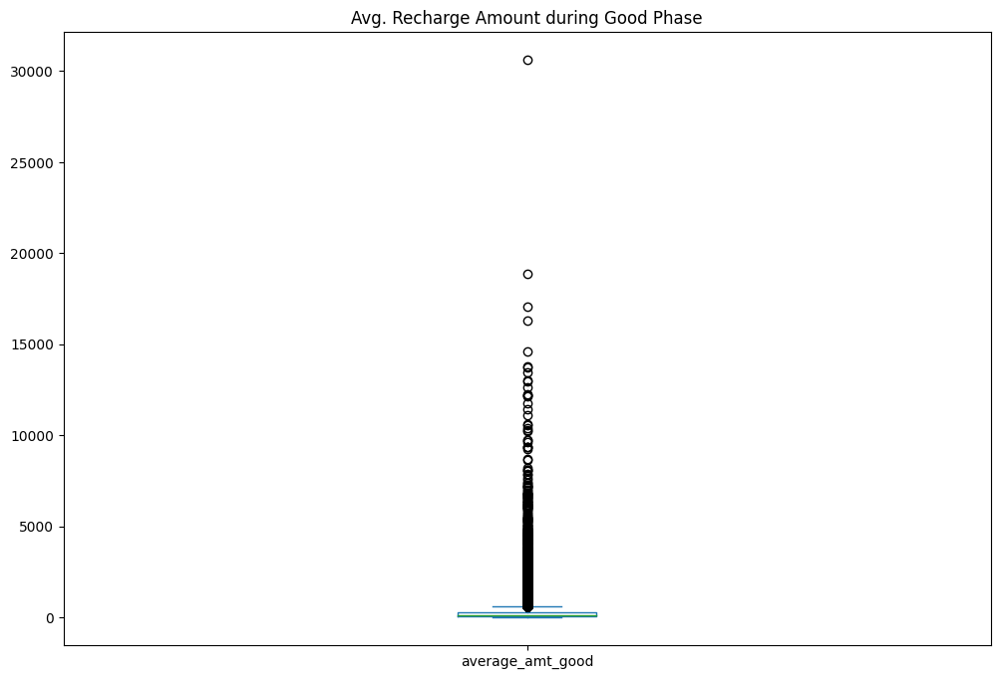

In [350]:
plt.figure(figsize = (12,8))
telecom['average_amt_good'].plot(kind='box')
plt.title('Avg. Recharge Amount during Good Phase')
plt.show()

In [351]:
telecom['average_amt_good'].describe(percentiles=[.25,.5,.70,.75,.80,.90,.95,.96,.97,.98,.99]).round(2)

count    99999.00
mean       242.66
std        434.71
min          0.00
25%         64.00
50%        137.50
70%        239.00
75%        276.50
80%        328.25
90%        514.00
95%        756.00
96%        859.25
97%        995.75
98%       1210.01
99%       1681.76
max      30618.00
Name: average_amt_good, dtype: float64

1. The presence of outliers are evident from the box plot
2. Outlier treatment might be needed

In [352]:
# create a filter for values greater than 70th percentile of total average recharge amount for good phase
A = telecom['average_amt_good'].quantile(0.7)
high_value_df = telecom[(telecom['average_amt_good'] >= A)]
high_value_df.shape

(30001, 229)

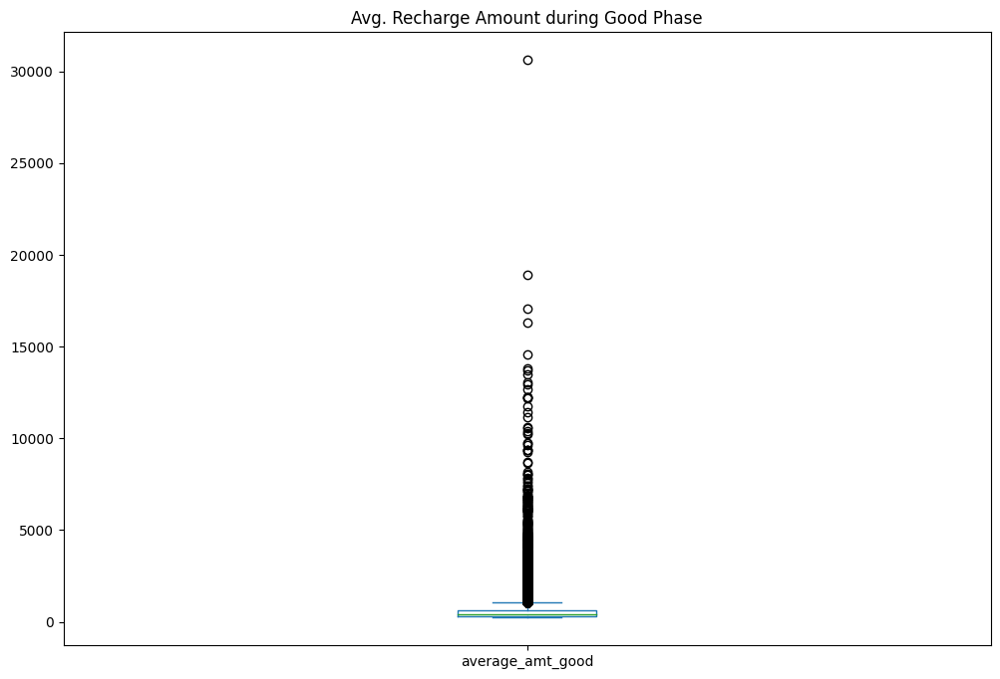

In [353]:
plt.figure(figsize = (12,8))
high_value_df['average_amt_good'].plot(kind='box')
plt.title('Avg. Recharge Amount during Good Phase')
plt.show()

In [354]:
high_value_df['average_amt_good'].describe(percentiles=[.70,.80,.90,.95,.99,.997,.999]).round(2)

count    30001.00
mean       576.31
std        679.36
min        239.00
50%        400.00
70%        546.25
80%        684.00
90%        995.75
95%       1399.25
99%       3045.25
99.7%     5470.50
99.9%     8704.25
max      30618.00
Name: average_amt_good, dtype: float64

1. In both abohighval_finalve the box plots it is very evident that after 99% the outlier presence is very high
2. In order to get a decent model and also not loose any important data: data point upto 99% is considered

In [355]:
B = telecom['average_amt_good'].quantile(0.99)
high_value = high_value_df[(high_value_df['average_amt_good'] <= B)]
high_value.shape

(29001, 229)

In [356]:
high_val_final = high_value.copy()

In [357]:
# Deleting the remaining blank / NA values
high_val_final = high_val_final.dropna(how='any',axis=0)
missing_data(high_val_final)

,Total,Percent
circle_id,0,0.0
max_rech_amt_6,0,0.0
max_rech_amt_8,0,0.0
max_rech_amt_9,0,0.0
date_of_last_rech_6,0,0.0
date_of_last_rech_7,0,0.0
date_of_last_rech_8,0,0.0
date_of_last_rech_9,0,0.0
last_day_rch_amt_6,0,0.0
last_day_rch_amt_7,0,0.0


**Tag churners and remove attribute of the churn phase**

Churned customers (churn=1, else 0) can be tagged based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes that need to be used to tag churners are:

total_ic_mou_9
total_og_mou_9
vol_2g_mb_9
vol_3g_mb_9

In [358]:
high_val_final[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].head()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
mobile_number,,,,
7000842753,0.00,0.00,0.00,0.00
7000701601,0.00,0.00,0.00,0.00
7001524846,34.91,142.18,0.00,0.00
7002124215,252.61,1031.53,0.00,0.00
7000887461,127.48,127.63,13.93,314.74


In [359]:
#Creating column for churn and classifying churned customers, Initially set all the values as 0
high_val_final['churn'] = 0
high_val_final['churn'].head()

mobile_number
7000842753    0
7000701601    0
7001524846    0
7002124215    0
7000887461    0
Name: churn, dtype: int64

In [360]:
# set all which having is_churned True condition as 1
churned = (high_val_final.total_ic_mou_9 == 0) & (high_val_final.total_og_mou_9 == 0) & (high_val_final.vol_2g_mb_9 == 0) & (high_val_final.vol_3g_mb_9 == 0)
high_val_final.loc[churned,'churn'] = 1

In [361]:
# Churn Rate %
round(100*high_val_final.churn.sum()/len(churned),2)

7.98

(array([0, 1]), [Text(0, 0, '0'), Text(1, 0, '1')])

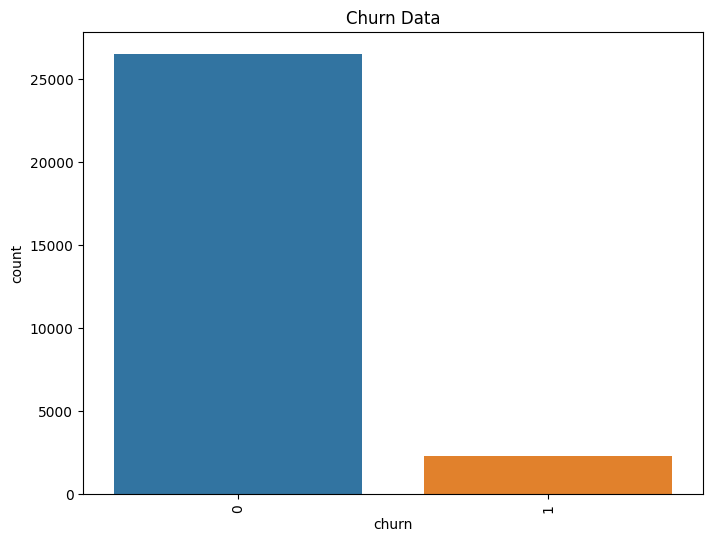

In [362]:
plt.figure(figsize=(8, 6))
plt.title("Churn Data")
sns.countplot(x = "churn", data = high_val_final)
xticks(rotation = 90)

1. The churn rate is 7.98%
2. From the rate and plot it is very clear that there is high imbalance

In [363]:
# Deleting all columns of month 9 as these values have to be predicted
month_9 = high_val_final.columns[high_val_final.columns.str.contains('_9')]
month_9

Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9',
       'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9',
       'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9',
       'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9',
       'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9',
       'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9',
       'night_pck_user

In [364]:
high_val_final.drop(month_9, axis=1, inplace = True)
high_val_final.shape

(28788, 176)

**Exploratory Data Analysis (EDA)**

As mentioned in the business statement below steps will be performed now

1. Conduct appropriate exploratory analysis to extract useful insights (whether directly useful for business or for eventual modelling/feature engineering).
2. Derive new features

Churned =  871.8619939050936
Not Churned =  1252.0717979691217


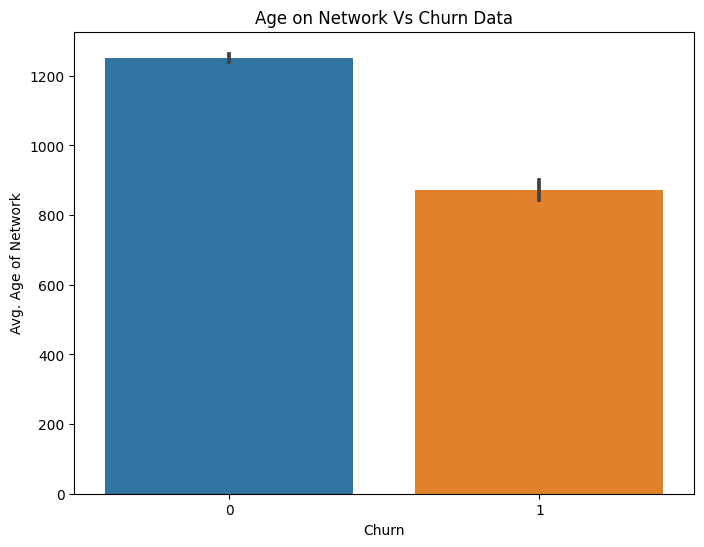

In [365]:
# AON(Age on network) - number of days the customer is using the operator T network
plt.figure(figsize=(8,6))
plt.title("Age on Network Vs Churn Data")
sns.barplot(x = 'churn', y = 'aon', data = high_val_final)
plt.ylabel('Avg. Age of Network')
plt.xlabel('Churn')
print("Churned = ", high_val_final.loc[high_val_final.churn == 1, 'aon'].mean())
print("Not Churned = ", high_val_final.loc[high_val_final.churn == 0, 'aon'].mean())

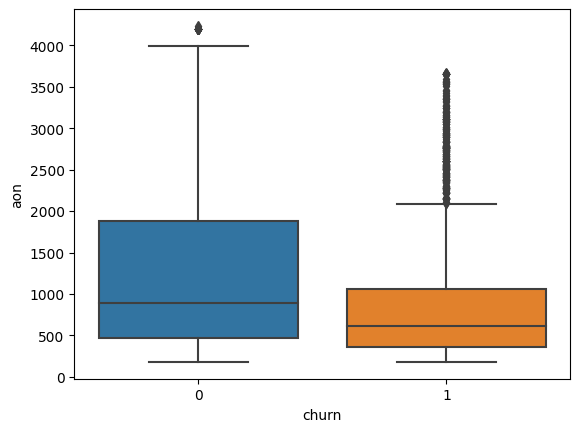

In [366]:
sns.boxplot(y = 'aon', x = 'churn', data = high_val_final)
plt.show()

1. Age on network seem to be good indicator or churn
2. The average age on network for churned customers approximately around 870 days

Churned =  771.4140182847192
Not Churned =  630.1905930315957


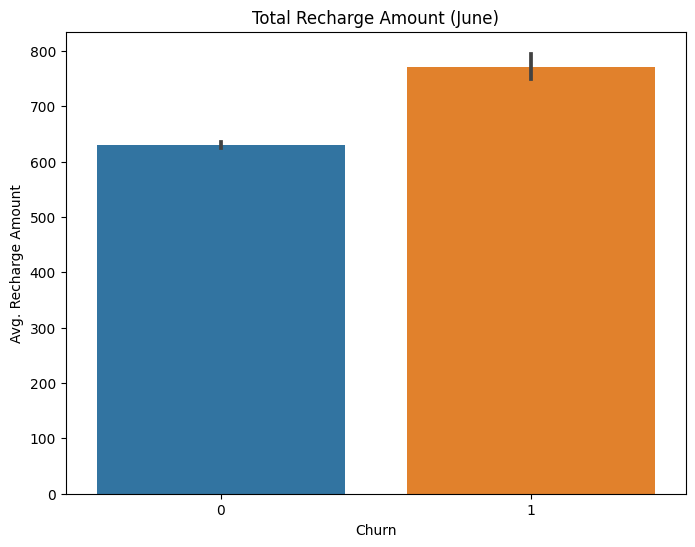

In [367]:
# Total Recharge Amount
# June
plt.figure(figsize=(8,6))
plt.title("Total Recharge Amount (June)")
sns.barplot(x = 'churn', y = 'total_rech_amt_6', data = high_val_final)
plt.ylabel('Avg. Recharge Amount')
plt.xlabel('Churn')
print("Churned = ", high_val_final.loc[high_val_final.churn == 1, 'total_rech_amt_6'].mean())
print("Not Churned = ", high_val_final.loc[high_val_final.churn == 0, 'total_rech_amt_6'].mean())


Churned =  613.2263822377014
Not Churned =  642.2913442301159


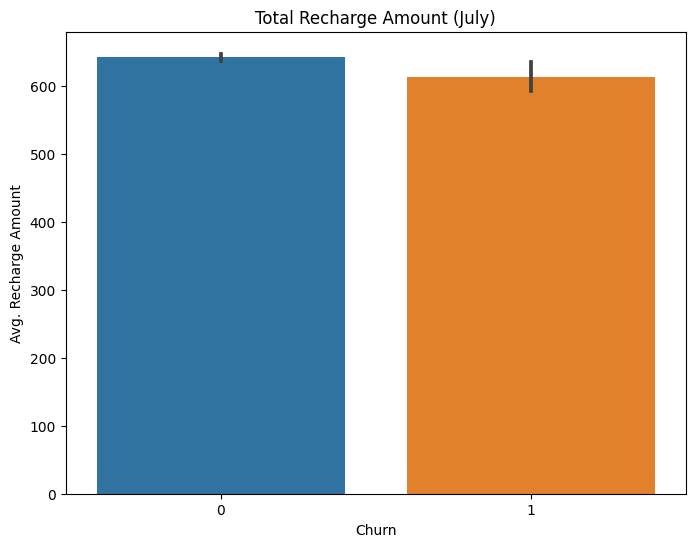

In [368]:
# July
plt.figure(figsize=(8,6))
plt.title("Total Recharge Amount (July)")
sns.barplot(x = 'churn', y = 'total_rech_amt_7', data = high_val_final)
plt.ylabel('Avg. Recharge Amount')
plt.xlabel('Churn')
print("Churned = ", high_val_final.loc[high_val_final.churn == 1, 'total_rech_amt_7'].mean())
print("Not Churned = ", high_val_final.loc[high_val_final.churn == 0, 'total_rech_amt_7'].mean())

Churned =  244.32477144101
Not Churned =  596.1673398512703


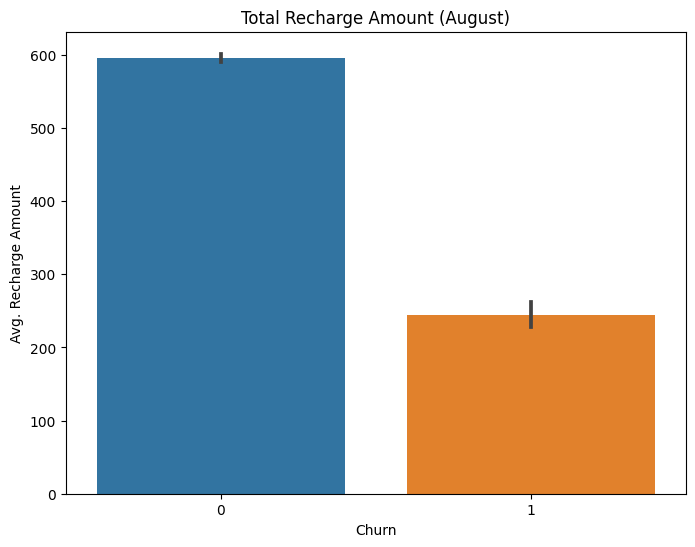

In [369]:
plt.figure(figsize=(8,6))
plt.title("Total Recharge Amount (August)")
sns.barplot(x = 'churn', y = 'total_rech_amt_8', data = high_val_final)
plt.ylabel('Avg. Recharge Amount')
plt.xlabel('Churn')
print("Churned = ", high_val_final.loc[high_val_final.churn == 1, 'total_rech_amt_8'].mean())
print("Not Churned = ", high_val_final.loc[high_val_final.churn == 0, 'total_rech_amt_8'].mean())

1. The average total recharge amount is highest for churned customers during the good phase
2. The average total recharge amount has dropped significantly for churned customers during action phase

In [370]:
# Creating a new feature for total recharge amount during good phase
high_val_final["total_rech_amt_goodphase"] = (high_val_final.total_rech_amt_6 + high_val_final.total_rech_amt_7)/2
# Dropping the original columns for good phase
high_val_final.drop(['total_rech_amt_6','total_rech_amt_7'], inplace=True, axis=1)

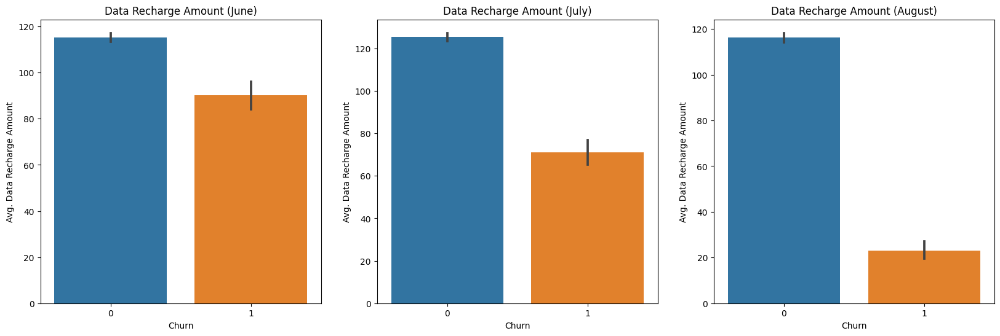

In [371]:
# Average Recharge Amount - Data
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Data Recharge Amount (June)")
sns.barplot(x = 'churn', y = 'av_rech_amt_data_6', data = high_val_final)
plt.ylabel('Avg. Data Recharge Amount')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Data Recharge Amount (July)")
sns.barplot(x = 'churn', y = 'av_rech_amt_data_7', data = high_val_final)
plt.ylabel('Avg. Data Recharge Amount')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Data Recharge Amount (August)")
sns.barplot(x = 'churn', y = 'av_rech_amt_data_8', data = high_val_final)
plt.ylabel('Avg. Data Recharge Amount')
plt.xlabel('Churn')
plt.show()

**The average data recharge amount is lower for churned customers than Non churned customers**

In [372]:
# Fidning the total data recharge amount
high_val_final["total_rech_amt_data_6"] = high_val_final.total_rech_data_6*high_val_final.av_rech_amt_data_6
high_val_final["total_rech_amt_data_7"] = high_val_final.total_rech_data_7*high_val_final.av_rech_amt_data_7
high_val_final["total_rech_amt_data_8"] = high_val_final.total_rech_data_8*high_val_final.av_rech_amt_data_8

In [373]:
# Creating a new feature for total data recharge amount during good phase
high_val_final["total_rech_amt_data_goodphase"] = (high_val_final.total_rech_amt_data_6 + high_val_final.total_rech_amt_data_7)/2

# Creating a new feature for total data + calls recharge amount during good phase
high_val_final["overall_rech_amt_goodphase"] = high_val_final.total_rech_amt_goodphase + high_val_final.total_rech_amt_data_goodphase

In [374]:
# Dropping the original columns for good phase

high_val_final.drop(['total_rech_data_6','total_rech_data_7','total_rech_data_8','av_rech_amt_data_6',
                    'av_rech_amt_data_7','av_rech_amt_data_8'], axis=1, inplace=True)

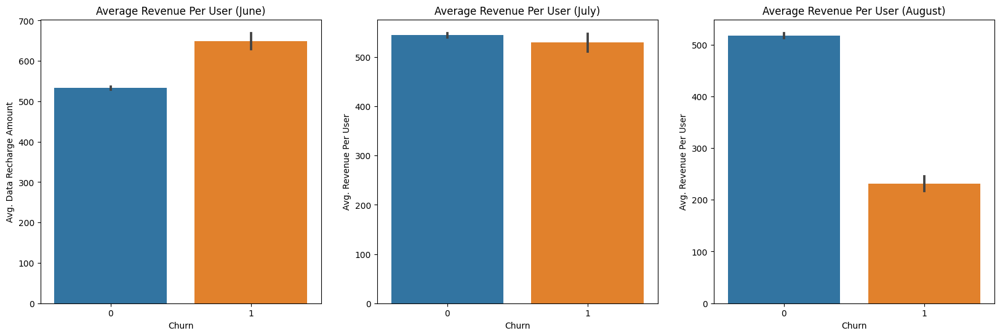

In [375]:
# ARPU - Average Revenue Per User

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Average Revenue Per User (June)")
sns.barplot(x = 'churn', y = 'arpu_6', data = high_val_final)
plt.ylabel('Avg. Data Recharge Amount')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Average Revenue Per User (July)")
sns.barplot(x = 'churn', y = 'arpu_7', data = high_val_final)
plt.ylabel('Avg. Revenue Per User')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Average Revenue Per User (August)")
sns.barplot(x = 'churn', y = 'arpu_8', data = high_val_final)
plt.ylabel('Avg. Revenue Per User')
plt.xlabel('Churn')
plt.show()

**Churned customers have the highest drop in average revenue/user compared to non-churned customers between good and action phase**

In [376]:
# Creating a new variable for Average Revenue Per User in good phase
high_val_final["arpu_goodphase"] = (high_val_final.arpu_6 + high_val_final.arpu_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['arpu_6','arpu_7'], axis=1, inplace=True)

Text(0.5, 0, 'Churn')

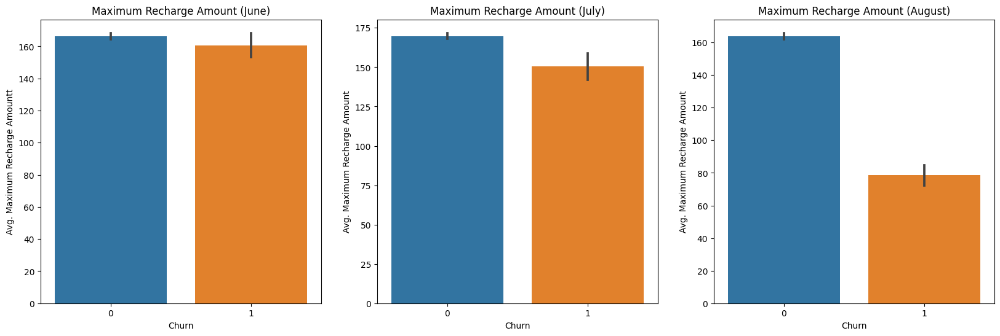

In [377]:

# Maximum Recharge Amount

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Maximum Recharge Amount (June)")
sns.barplot(x = 'churn', y = 'max_rech_amt_6', data = high_val_final)
plt.ylabel('Avg. Maximum Recharge Amountt')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Maximum Recharge Amount (July)")
sns.barplot(x = 'churn', y = 'max_rech_amt_7', data = high_val_final)
plt.ylabel('Avg. Maximum Recharge Amount')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Maximum Recharge Amount (August)")
sns.barplot(x = 'churn', y = 'max_rech_amt_8', data = high_val_final)
plt.ylabel('Avg. Maximum Recharge Amount')
plt.xlabel('Churn')

**Churned customers have the highest drop in avg. max recharge amount compared to non-churned customers between good and action phase**

In [378]:
# Creating a new variable for avg. max recharge amount in good phase
high_val_final["max_rech_amt_calls_goodphase"] = (high_val_final.max_rech_amt_6 + high_val_final.max_rech_amt_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['max_rech_amt_6','max_rech_amt_7'], axis=1, inplace=True)

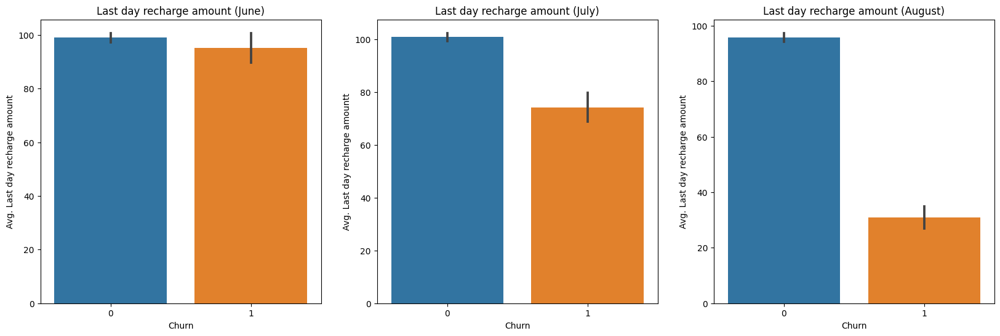

In [379]:
# last_day_rch_amt (rch = recharge, amt = amount)

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Last day recharge amount (June)")
sns.barplot(x = 'churn', y = 'last_day_rch_amt_6', data = high_val_final)
plt.ylabel('Avg. Last day recharge amount')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Last day recharge amount (July)")
sns.barplot(x = 'churn', y = 'last_day_rch_amt_7', data = high_val_final)
plt.ylabel('Avg. Last day recharge amountt')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Last day recharge amount (August)")
sns.barplot(x = 'churn', y = 'last_day_rch_amt_8', data = high_val_final)
plt.ylabel('Avg. Last day recharge amount')
plt.xlabel('Churn')
plt.show()

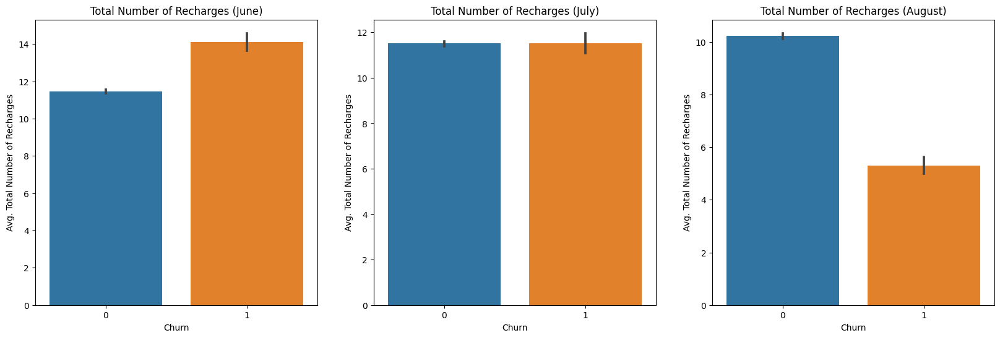

In [380]:
# total_rech_num
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Total Number of Recharges (June)")
sns.barplot(x = 'churn', y = 'total_rech_num_6', data = high_val_final)
plt.ylabel('Avg. Total Number of Recharges')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Total Number of Recharges (July)")
sns.barplot(x = 'churn', y = 'total_rech_num_7', data = high_val_final)
plt.ylabel('Avg. Total Number of Recharges')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Total Number of Recharges (August)")
sns.barplot(x = 'churn', y = 'total_rech_num_8', data = high_val_final)
plt.ylabel('Avg. Total Number of Recharges')
plt.xlabel('Churn')
plt.show()

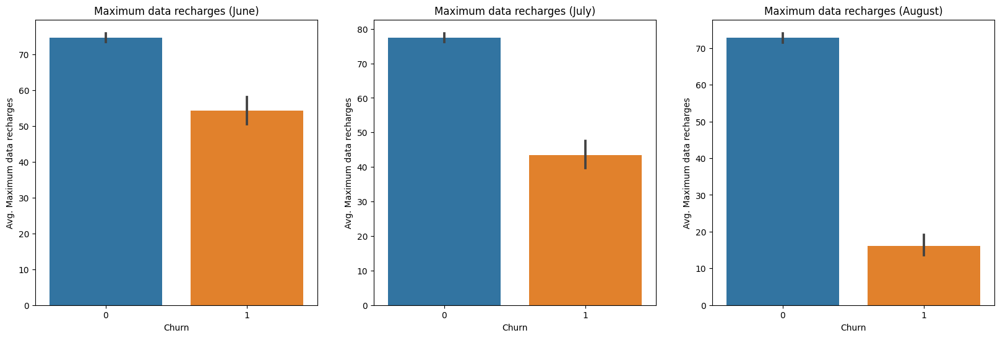

In [381]:
# max_rech_data

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Maximum data recharges (June)")
sns.barplot(x = 'churn', y = 'max_rech_data_6', data = high_val_final)
plt.ylabel('Avg. Maximum data recharges')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Maximum data recharges (July)")
sns.barplot(x = 'churn', y = 'max_rech_data_7', data = high_val_final)
plt.ylabel('Avg. Maximum data recharges')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Maximum data recharges (August)")
sns.barplot(x = 'churn', y = 'max_rech_data_8', data = high_val_final)
plt.ylabel('Avg. Maximum data recharges')
plt.xlabel('Churn')
plt.show()

**Churned customers have the highest drop in last day recharge amount, max recharge and total recharge values compared to non-churned customers between good and action phase**

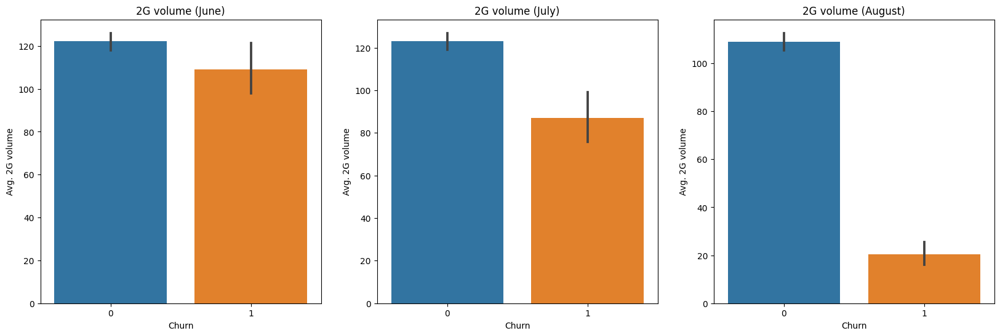

In [382]:
# vol_2g_mb

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("2G volume (June)")
sns.barplot(x = 'churn', y = 'vol_2g_mb_6', data = high_val_final)
plt.ylabel('Avg. 2G volume')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("2G volume (July)")
sns.barplot(x = 'churn', y = 'vol_2g_mb_7', data = high_val_final)
plt.ylabel('Avg. 2G volume')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("2G volume (August)")
sns.barplot(x = 'churn', y = 'vol_2g_mb_8', data = high_val_final)
plt.ylabel('Avg. 2G volume')
plt.xlabel('Churn')
plt.show()


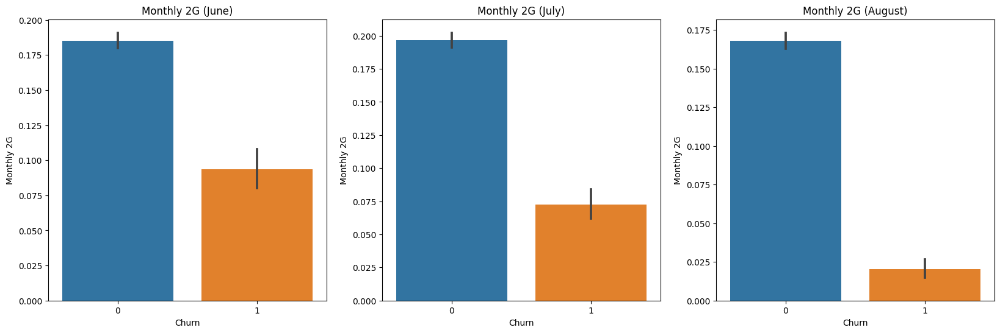

In [383]:
# monthly_2g

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Monthly 2G (June)")
sns.barplot(x = 'churn', y = 'monthly_2g_6', data = high_val_final)
plt.ylabel('Monthly 2G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Monthly 2G (July)")
sns.barplot(x = 'churn', y = 'monthly_2g_7', data = high_val_final)
plt.ylabel('Monthly 2G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Monthly 2G (August)")
sns.barplot(x = 'churn', y = 'monthly_2g_8', data = high_val_final)
plt.ylabel('Monthly 2G')
plt.xlabel('Churn')
plt.show()

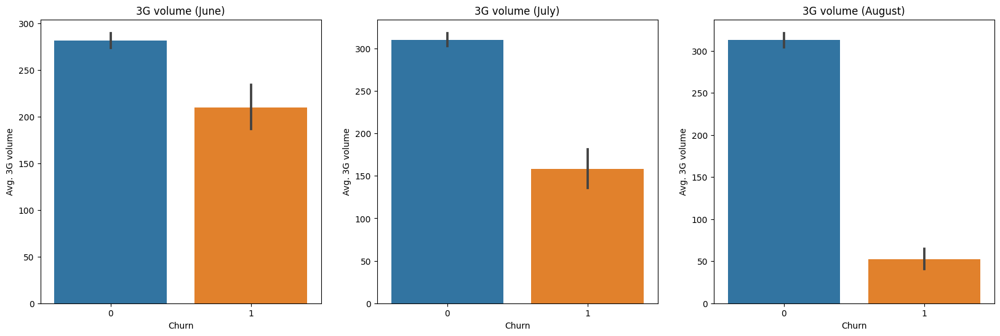

In [384]:
# vol_3g_mb

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("3G volume (June)")
sns.barplot(x = 'churn', y = 'vol_3g_mb_6', data = high_val_final)
plt.ylabel('Avg. 3G volume')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("3G volume (July)")
sns.barplot(x = 'churn', y = 'vol_3g_mb_7', data = high_val_final)
plt.ylabel('Avg. 3G volume')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("3G volume (August)")
sns.barplot(x = 'churn', y = 'vol_3g_mb_8', data = high_val_final)
plt.ylabel('Avg. 3G volume')
plt.xlabel('Churn')
plt.show()

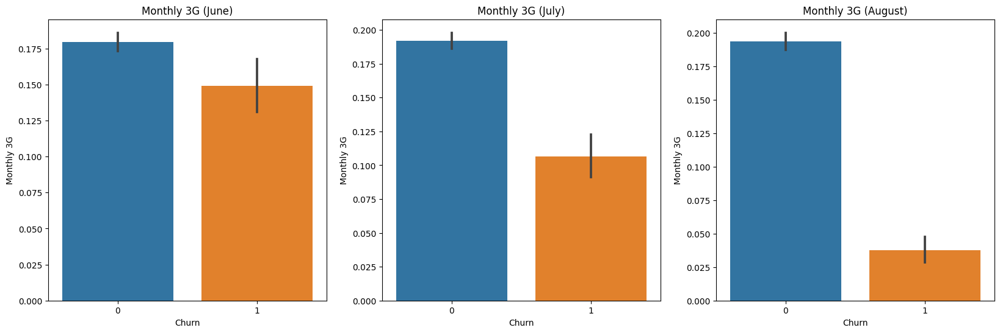

In [385]:
# monthly_3g

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Monthly 3G (June)")
sns.barplot(x = 'churn', y = 'monthly_3g_6', data = high_val_final)
plt.ylabel('Monthly 3G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Monthly 3G (July)")
sns.barplot(x = 'churn', y = 'monthly_3g_7', data = high_val_final)
plt.ylabel('Monthly 3G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Monthly 3G (August)")
sns.barplot(x = 'churn', y = 'monthly_3g_8', data = high_val_final)
plt.ylabel('Monthly 3G')
plt.xlabel('Churn')
plt.show()

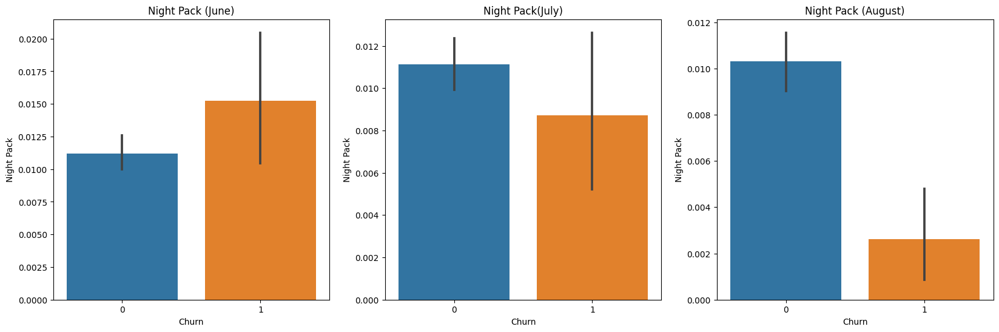

In [386]:
# night_pck_user

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Night Pack (June)")
sns.barplot(x = 'churn', y = 'night_pck_user_6', data = high_val_final)
plt.ylabel('Night Pack')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Night Pack(July)")
sns.barplot(x = 'churn', y = 'night_pck_user_7', data = high_val_final)
plt.ylabel('Night Pack')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Night Pack (August)")
sns.barplot(x = 'churn', y = 'night_pck_user_8', data = high_val_final)
plt.ylabel('Night Pack')
plt.xlabel('Churn')
plt.show()

**Different data packs have significant impact on churn rate between good and action phase**

In [387]:
# Creating a new variable for monthly 2G and 3G
high_val_final["monthly_2g_goodphase"] = (high_val_final.monthly_2g_6 + high_val_final.monthly_2g_7)/2
high_val_final["monthly_3g_goodphase"] = (high_val_final.monthly_3g_6 + high_val_final.monthly_3g_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['monthly_2g_6','monthly_2g_7','monthly_3g_6','monthly_3g_7'], axis=1, inplace=True)

In [388]:
#Creating a new variable for 2G and 3G Volumes
high_val_final["vol_2g_mb_goodphase"] = (high_val_final.vol_2g_mb_6 + high_val_final.vol_2g_mb_7)/2
high_val_final["vol_3g_mb_goodphase"] = (high_val_final.vol_3g_mb_6 + high_val_final.vol_3g_mb_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['vol_2g_mb_6','vol_2g_mb_7','vol_3g_mb_6','vol_3g_mb_7'], axis=1, inplace=True)

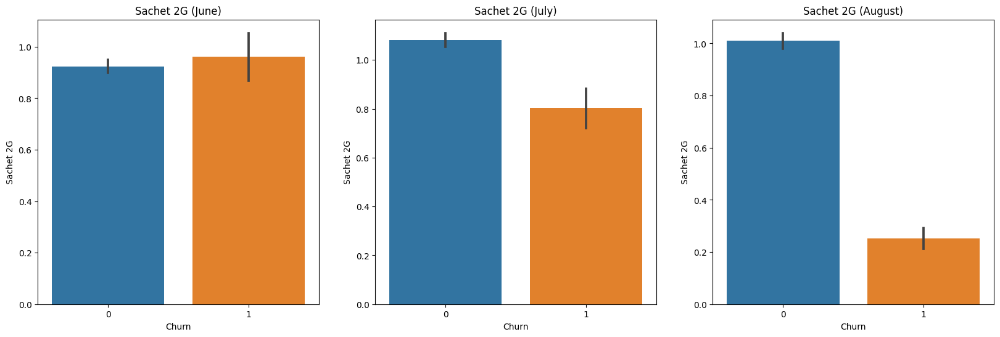

In [389]:
# sachet_2g

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Sachet 2G (June)")
sns.barplot(x = 'churn', y = 'sachet_2g_6', data = high_val_final)
plt.ylabel('Sachet 2G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Sachet 2G (July)")
sns.barplot(x = 'churn', y = 'sachet_2g_7', data = high_val_final)
plt.ylabel('Sachet 2G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Sachet 2G (August)")
sns.barplot(x = 'churn', y = 'sachet_2g_8', data = high_val_final)
plt.ylabel('Sachet 2G')
plt.xlabel('Churn')
plt.show()


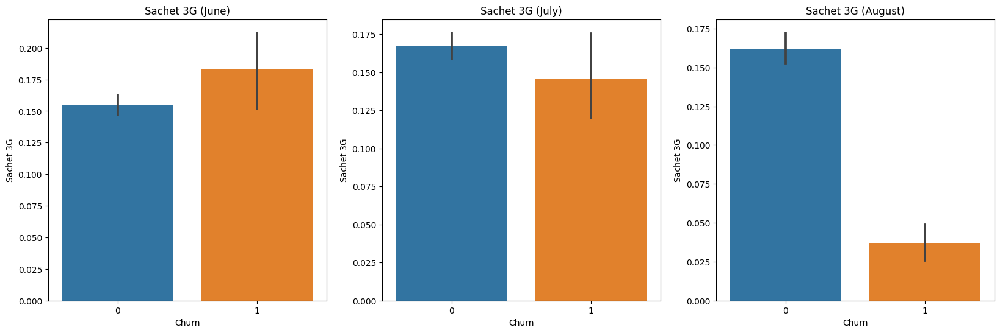

In [390]:
# sachet_3g

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Sachet 3G (June)")
sns.barplot(x = 'churn', y = 'sachet_3g_6', data = high_val_final)
plt.ylabel('Sachet 3G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Sachet 3G (July)")
sns.barplot(x = 'churn', y = 'sachet_3g_7', data = high_val_final)
plt.ylabel('Sachet 3G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Sachet 3G (August)")
sns.barplot(x = 'churn', y = 'sachet_3g_8', data = high_val_final)
plt.ylabel('Sachet 3G')
plt.xlabel('Churn')
plt.show()


In [391]:
# Creating a new variable for sachet 2G and 3G
high_val_final["sachet_2g_goodphase"] = (high_val_final.sachet_2g_6 + high_val_final.sachet_2g_7)/2
high_val_final["sachet_3g_goodphase"] = (high_val_final.sachet_3g_6 + high_val_final.sachet_3g_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['sachet_2g_6','sachet_2g_7','sachet_3g_6','sachet_3g_7'], axis=1, inplace=True)

In [392]:
# Volume based cost - when no specific scheme is not purchased and paid as per usage
# changing the Volume based cost column names same as others
high_val_final.rename(columns= {'jun_vbc_3g': 'vbc_3g_6', 'jul_vbc_3g':'vbc_3g_7', 'aug_vbc_3g':'vbc_3g_8'}, inplace=True)
high_val_final.drop('sep_vbc_3g', axis = 1, inplace=True)

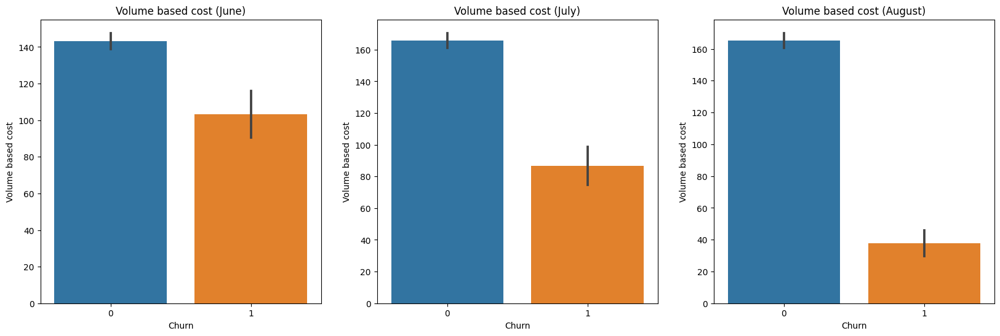

In [393]:
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Volume based cost (June)")
sns.barplot(x = 'churn', y = 'vbc_3g_6', data = high_val_final)
plt.ylabel('Volume based cost')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Volume based cost (July)")
sns.barplot(x = 'churn', y = 'vbc_3g_7', data = high_val_final)
plt.ylabel('Volume based cost')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Volume based cost (August)")
sns.barplot(x = 'churn', y = 'vbc_3g_8', data = high_val_final)
plt.ylabel('Volume based cost')
plt.xlabel('Churn')
plt.show()

In [394]:
# Creating a new variable for VBC
high_val_final["vbc_3g_goodphase"] = (high_val_final.vbc_3g_6 + high_val_final.vbc_3g_7)/2

# Dropping the original columns for good phase
high_val_final.drop(['vbc_3g_6','vbc_3g_7'], axis=1, inplace=True)

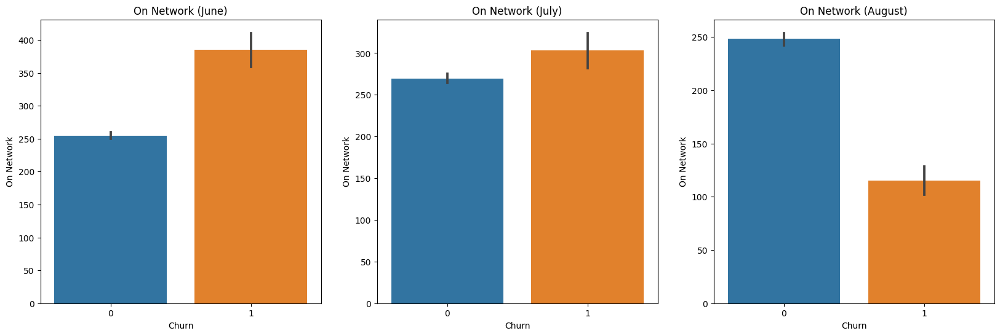

In [395]:
 #All kind of calls within the same operator network - onnet

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("On Network (June)")
sns.barplot(x = 'churn', y = 'onnet_mou_6', data = high_val_final)
plt.ylabel('On Network')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("On Network (July)")
sns.barplot(x = 'churn', y = 'onnet_mou_7', data = high_val_final)
plt.ylabel('On Network')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("On Network (August)")
sns.barplot(x = 'churn', y = 'onnet_mou_8', data = high_val_final)
plt.ylabel('On Network')
plt.xlabel('Churn')
plt.show()


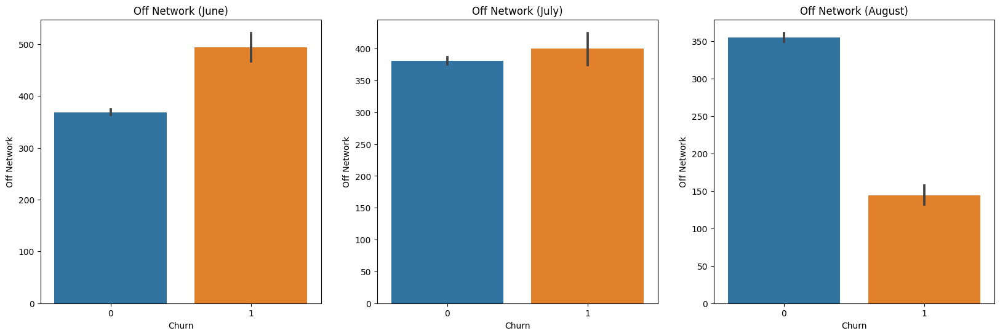

In [396]:
# All kind of calls outside the operator T network - offnet

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Off Network (June)")
sns.barplot(x = 'churn', y = 'offnet_mou_6', data = high_val_final)
plt.ylabel('Off Network')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Off Network (July)")
sns.barplot(x = 'churn', y = 'offnet_mou_7', data = high_val_final)
plt.ylabel('Off Network')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Off Network (August)")
sns.barplot(x = 'churn', y = 'offnet_mou_8', data = high_val_final)
plt.ylabel('Off Network')
plt.xlabel('Churn')
plt.show()


**Churned customers have the highest drop in VBC, sachet 2g/3g and onnet/offnet values compared to non-churned customers between good and action phase**

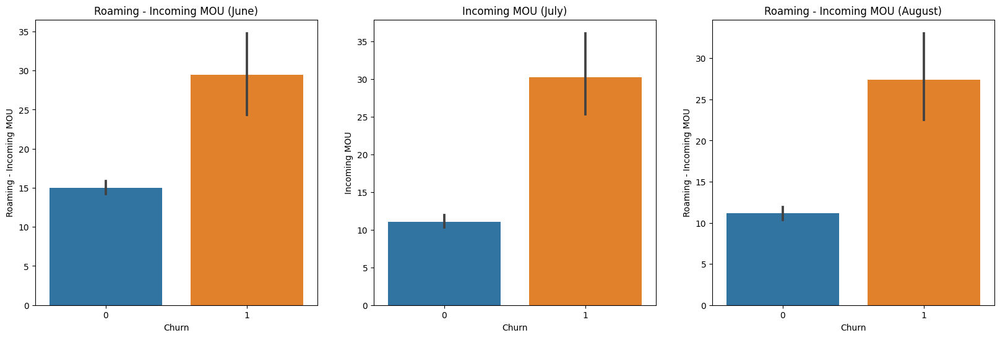

In [397]:
# Roaming Minutes of usage (voice calls) - Incoming calls

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Roaming - Incoming MOU (June)")
sns.barplot(x = 'churn', y = 'roam_ic_mou_6', data = high_val_final)
plt.ylabel('Roaming - Incoming MOU')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Incoming MOU (July)")
sns.barplot(x = 'churn', y = 'roam_ic_mou_7', data = high_val_final)
plt.ylabel('Incoming MOU')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Roaming - Incoming MOU (August)")
sns.barplot(x = 'churn', y = 'roam_ic_mou_8', data = high_val_final)
plt.ylabel('Roaming - Incoming MOU')
plt.xlabel('Churn')
plt.show()


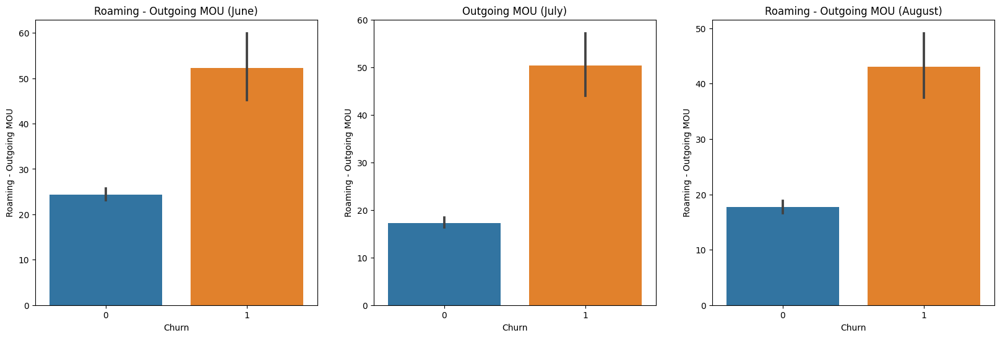

In [398]:
 # Roaming Minutes of usage (voice calls) - Outgoing calls

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Roaming - Outgoing MOU (June)")
sns.barplot(x = 'churn', y = 'roam_og_mou_6', data = high_val_final)
plt.ylabel('Roaming - Outgoing MOU')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Outgoing MOU (July)")
sns.barplot(x = 'churn', y = 'roam_og_mou_7', data = high_val_final)
plt.ylabel('Roaming - Outgoing MOU')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Roaming - Outgoing MOU (August)")
sns.barplot(x = 'churn', y = 'roam_og_mou_8', data = high_val_final)
plt.ylabel('Roaming - Outgoing MOU')
plt.xlabel('Churn')
plt.show()

There is no much difference between good phase and action phase for churned customers w.r.t. roaming MOU

In [399]:
# Overall Incoming and Outgoing MOU
mou = high_val_final.columns[high_val_final.columns.str.contains('_mou')]
mou

Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'onnet_mou_6',
       'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6',
       'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6',
       'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7',
       'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7',
       'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7',
       'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8',
       'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6',
       'spl_o

1. According to the data dictionary/ buisness understanding below are the explanation for above parameters
2. T2T - Operator T to T, i.e. within same operator (mobile to mobile)
3. T2M - Operator T to other operator mobile
4. T2O - Operator T to other operator fixed line
5. T2F - Operator T to fixed lines of T
6. LOC - Local calls - within same telecom circle
7. STD - STD calls - outside the calling circle
8. IC - Incoming calls
9. OG - Outgoing calls
Also the total MOU is equal to the sum of individual MOU (t2t,t2f,t2m & t2O)
This can be verified for a June month data to confirm

In [400]:
# Quick check on incoming usage for june - Local
print("Incoming")
high_val_final.loc_ic_mou_6.sum()
high_val_final.loc_ic_t2t_mou_6.sum()+ high_val_final.loc_ic_t2m_mou_6.sum()+high_val_final.loc_ic_t2f_mou_6.sum()
# Quick check on outgoing usage for june - Local
print("Outgoing")
high_val_final.loc_og_mou_6.sum()
high_val_final.loc_og_t2t_mou_6.sum()+ high_val_final.loc_og_t2m_mou_6.sum()+high_val_final.loc_og_t2f_mou_6.sum()

Incoming
Outgoing


7396354.720000001

In [401]:
# Quick check on incoming usage for june - STD
print("Incoming")
high_val_final.std_ic_mou_6.sum()
high_val_final.std_ic_t2t_mou_6.sum()+ high_val_final.std_ic_t2m_mou_6.sum()+high_val_final.std_ic_t2f_mou_6.sum()
# Quick check on outgoing usage for june - STD
print("Outgoing")
high_val_final.std_og_mou_6.sum()
high_val_final.std_og_t2t_mou_6.sum()+ high_val_final.std_og_t2m_mou_6.sum()+high_val_final.std_og_t2f_mou_6.sum()

Incoming
Outgoing


10176895.91

In [402]:
# Quick check on incoming usage for june - ISD
print("Incoming")
high_val_final.total_ic_mou_6.sum()
high_val_final.loc_ic_mou_6.sum()+high_val_final.std_ic_mou_6.sum()+high_val_final.isd_ic_mou_6.sum()+high_val_final.spl_ic_mou_6.sum()+high_val_final.ic_others_6.sum()
# # Quick check on outgoing usage for june - ISD
print("Outgoing")
high_val_final.total_og_mou_6.sum()
high_val_final.loc_og_mou_6.sum()+ high_val_final.std_og_mou_6.sum()+high_val_final.isd_og_mou_6.sum()+high_val_final.spl_og_mou_6.sum()+high_val_final.og_others_6.sum()

Incoming
Outgoing


17799640.840000004

As above results look similar we can use the overall / total and ignore the individual components
Also new features can be derived from it

In [403]:
# Creating new features for incoming and outgoing MOU for good phase
# Local incoming
high_val_final["loc_ic_t2f_mou_goodphase"] = (high_val_final.loc_ic_t2f_mou_6 + high_val_final.loc_ic_t2f_mou_7)/2
high_val_final["loc_ic_t2m_mou_goodphase"] = (high_val_final.loc_ic_t2m_mou_6 + high_val_final.loc_ic_t2m_mou_7)/2
high_val_final["loc_ic_t2t_mou_goodphase"] = (high_val_final.loc_ic_t2t_mou_6 + high_val_final.loc_ic_t2t_mou_7)/2

In [404]:
# STD incoming
high_val_final["std_ic_t2f_mou_goodphase"] = (high_val_final.std_ic_t2f_mou_6 + high_val_final.std_ic_t2f_mou_7)/2
high_val_final["std_ic_t2m_mou_goodphase"] = (high_val_final.std_ic_t2m_mou_6 + high_val_final.std_ic_t2m_mou_7)/2
high_val_final["std_ic_t2o_mou_goodphase"] = (high_val_final.std_ic_t2o_mou_6 + high_val_final.std_ic_t2o_mou_7)/2
high_val_final["std_ic_t2t_mou_goodphase"] = (high_val_final.std_ic_t2t_mou_6 + high_val_final.std_ic_t2t_mou_7)/2

# Other incoming
high_val_final["isd_ic_mou_goodphase"] = (high_val_final.isd_ic_mou_6 + high_val_final.isd_ic_mou_7)/2
high_val_final["spl_ic_mou_goodphase"] = (high_val_final.spl_ic_mou_6 + high_val_final.spl_ic_mou_7)/2
high_val_final["ic_others_goodphase"] = (high_val_final.ic_others_6 + high_val_final.ic_others_7)/2
high_val_final["roam_ic_mou_goodphase"] = (high_val_final.roam_ic_mou_6 + high_val_final.roam_ic_mou_7)/2

In [405]:
# Local outgoing
high_val_final["loc_og_t2f_mou_goodphase"] = (high_val_final.loc_og_t2f_mou_6 + high_val_final.loc_og_t2f_mou_7)/2
high_val_final["loc_og_t2m_mou_goodphase"] = (high_val_final.loc_og_t2m_mou_6 + high_val_final.loc_og_t2m_mou_7)/2
high_val_final["loc_og_t2t_mou_goodphase"] = (high_val_final.loc_og_t2t_mou_6 + high_val_final.loc_og_t2t_mou_7)/2

In [406]:
# STD Outgoing
high_val_final["std_og_t2f_mou_goodphase"] = (high_val_final.std_og_t2f_mou_6 + high_val_final.std_og_t2f_mou_7)/2
high_val_final["std_og_t2m_mou_goodphase"] = (high_val_final.std_og_t2m_mou_6 + high_val_final.std_og_t2m_mou_7)/2
high_val_final["std_og_t2t_mou_goodphase"] = (high_val_final.std_og_t2t_mou_6 + high_val_final.std_og_t2t_mou_7)/2
# Other Outgoing
high_val_final["isd_og_mou_goodphase"] = (high_val_final.isd_og_mou_6 + high_val_final.isd_og_mou_7)/2
high_val_final["spl_og_mou_goodphase"] = (high_val_final.spl_og_mou_6 + high_val_final.spl_og_mou_7)/2
high_val_final["og_others_goodphase"] = (high_val_final.og_others_6 + high_val_final.og_others_7)/2
high_val_final["roam_og_mou_goodphase"] = (high_val_final.roam_og_mou_6 + high_val_final.roam_og_mou_7)/2

In [407]:
# Dropping redundant columns
# Incoming
high_val_final.drop(['loc_ic_t2f_mou_6','loc_ic_t2m_mou_6','loc_ic_t2t_mou_6','std_ic_t2f_mou_6',
                           'std_ic_t2m_mou_6','std_ic_t2o_mou_6','std_ic_t2t_mou_6','isd_ic_mou_6', 'spl_ic_mou_6',
                           'ic_others_6', 'roam_ic_mou_6','loc_ic_t2f_mou_7','loc_ic_t2m_mou_7','loc_ic_t2t_mou_7',
                           'std_ic_t2f_mou_7','std_ic_t2m_mou_7', 'std_ic_t2o_mou_7','std_ic_t2t_mou_7',
                           'isd_ic_mou_7', 'spl_ic_mou_7', 'ic_others_7','roam_ic_mou_7'], inplace=True, axis=1)

In [408]:
# Outgoing
high_val_final.drop(['loc_og_t2f_mou_6','loc_og_t2m_mou_6', 'loc_og_t2t_mou_6',
                           'std_og_t2f_mou_6','std_og_t2m_mou_6', 'std_og_t2t_mou_6', 'isd_og_mou_6',
                           'spl_og_mou_6', 'og_others_6','roam_og_mou_6', 'loc_og_t2f_mou_7','loc_og_t2m_mou_7',
                           'loc_og_t2t_mou_7','std_og_t2f_mou_7','std_og_t2m_mou_7','std_og_t2t_mou_7',
                           'isd_og_mou_7', 'spl_og_mou_7', 'og_others_7', 'roam_og_mou_7'], inplace=True, axis=1)

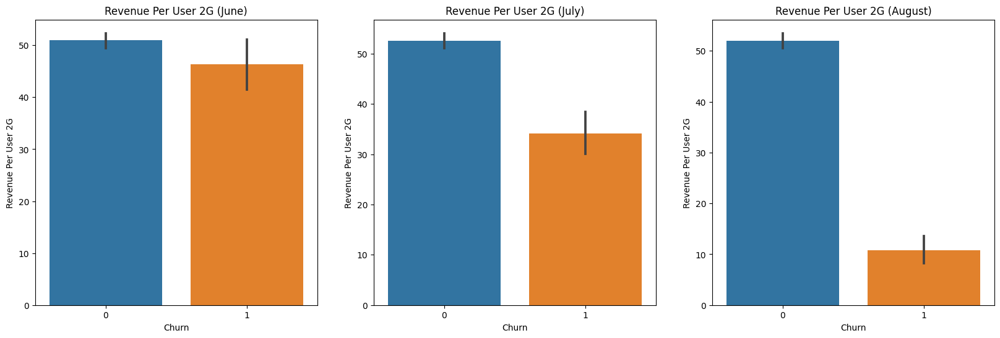

In [409]:
# RPU - Revenue Per User 2G

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Revenue Per User 2G (June)")
sns.barplot(x = 'churn', y = 'arpu_2g_6', data = high_val_final)
plt.ylabel('Revenue Per User 2G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Revenue Per User 2G (July)")
sns.barplot(x = 'churn', y = 'arpu_2g_7', data = high_val_final)
plt.ylabel('Revenue Per User 2G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Revenue Per User 2G (August)")
sns.barplot(x = 'churn', y = 'arpu_2g_8', data = high_val_final)
plt.ylabel('Revenue Per User 2G')
plt.xlabel('Churn')
plt.show()

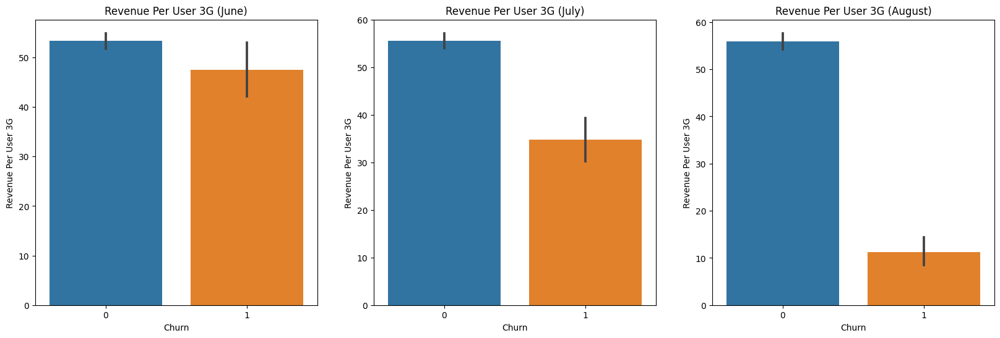

In [410]:
# RPU - Revenue Per User 3G

plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
# June
plt.title("Revenue Per User 3G (June)")
sns.barplot(x = 'churn', y = 'arpu_3g_6', data = high_val_final)
plt.ylabel('Revenue Per User 3G')
plt.xlabel('Churn')

plt.subplot(1,3,2)
# July
plt.title("Revenue Per User 3G (July)")
sns.barplot(x = 'churn', y = 'arpu_3g_7', data = high_val_final)
plt.ylabel('Revenue Per User 3G')
plt.xlabel('Churn')

plt.subplot(1,3,3)
# August
plt.title("Revenue Per User 3G (August)")
sns.barplot(x = 'churn', y = 'arpu_3g_8', data = high_val_final)
plt.ylabel('Revenue Per User 3G')
plt.xlabel('Churn')
plt.show()

In [411]:
high_val_final.shape

(28788, 140)

In [412]:

high_val_final.to_csv("high_value_final.csv")

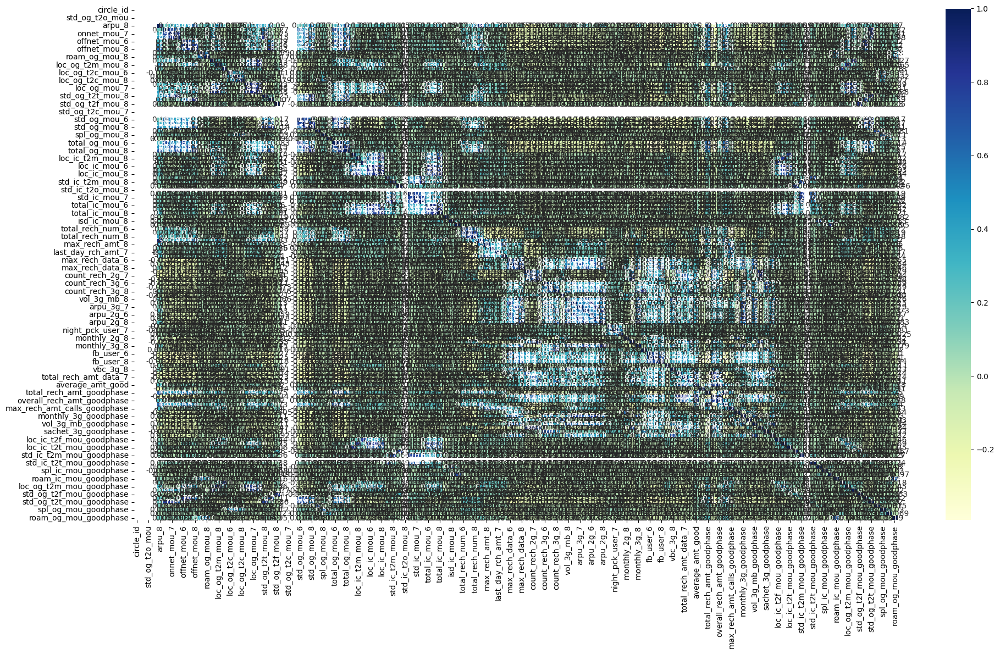

In [413]:
# Correlation Matrix / Heat map
plt.figure(figsize=(20,12))
cor = high_val_final.corr()
sns.heatmap(cor, annot=True, cmap="YlGnBu")
plt.tight_layout()
plt.show()

In [414]:
# Dropping date columns & circle id as it will nit be needed for modelling and also we have other new features

high_val_final.drop(['last_date_of_month_6','last_date_of_month_7', 'last_date_of_month_8','date_of_last_rech_6',
                    'date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_data_6','date_of_last_rech_data_7',
                    'date_of_last_rech_data_8'], axis=1, inplace=True)
high_val_final.drop('circle_id', axis = 1, inplace = True)
high_val_final.shape

(28788, 130)

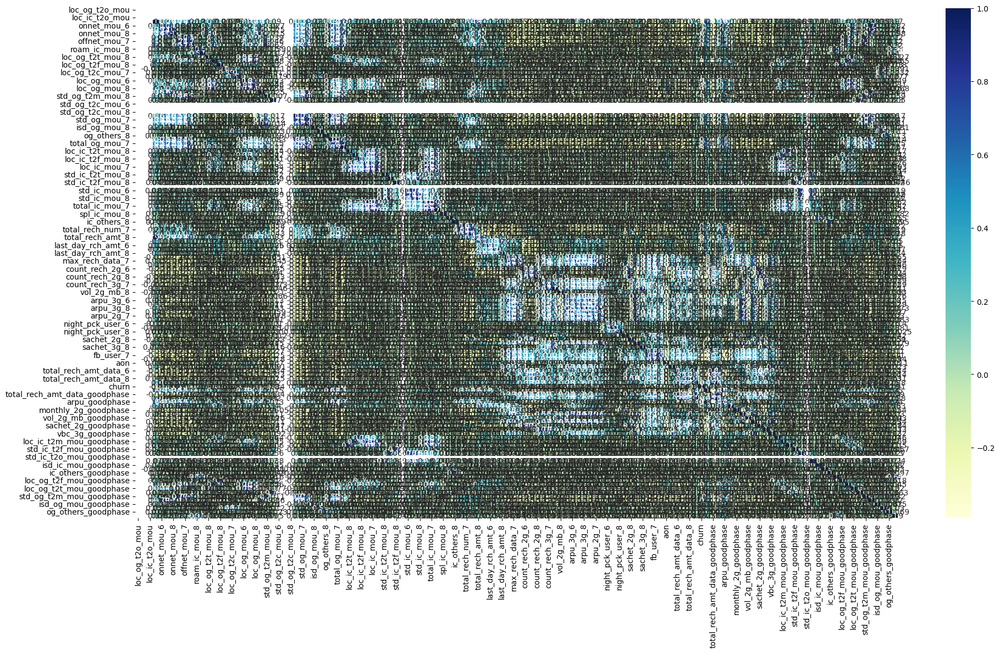

In [415]:
# Correlation Matrix / Heat map
plt.figure(figsize=(20,12))
cor = high_val_final.corr()
sns.heatmap(cor, annot=True, cmap="YlGnBu")
plt.tight_layout()
plt.show()

*** Modelling***

Below steps will be followed to build a model tp predict the customer who will churn

1. Train Test Split
2. Handling Imbalanced dataset - Synthetic Minority Over-sampling Technique has been designed to generate new samples that are coherent with the minor class distribution.

3. Scaling using StandardScaler
4. Dimentionality reduction using PCA
5. Train a variety of models - Logistic and Random Forest
6. Hyper parameter tuning
7. Evaluate the models using appropriate evaluation metrics - Accuracy,
8. Precision and Recall
9. Model selection based on metrics

In [416]:
telecom_model = high_val_final.copy()

** Train Test Split**

In [417]:
# Response variable
y = telecom_model['churn']
# Feature variable
x = telecom_model.drop('churn', axis=1)

In [418]:
# Split the data between train and test
x_train, x_test, y_train, y_test = train_test_split(x, y, train_size = 0.7, test_size = 0.3, random_state = RANDOM_STATE)

**Handling Imbalanced dataset - Synthetic Minority Over-sampling Technique**

In [419]:
# This is performed only on train data set as balancing is needed whie training the model
#check churn ratio before balacing using smote
print('Churn % before balancing')
(100 * y_train.value_counts()/ y_train.shape[0]).round(2)

Churn % before balancing


0    92.14
1     7.86
Name: churn, dtype: float64

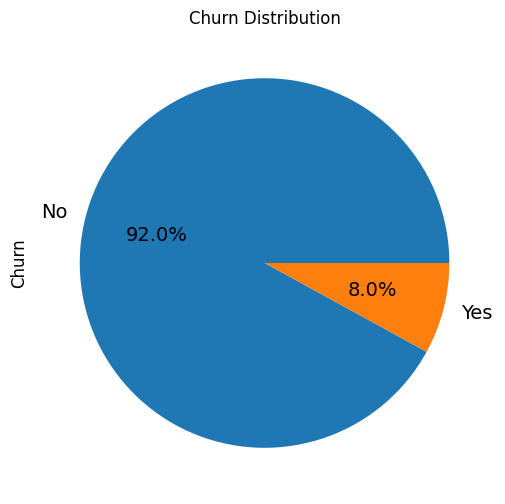

In [420]:
#Churn Distribution
pie_chart = telecom_model['churn'].value_counts()*100.0 /len(telecom_model)
ax = pie_chart.plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(8,6), fontsize = 14 )
ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)
plt.show()

In [421]:
# Balancing
smote = SMOTE()
x_train, y_train = smote.fit_resample(x_train, y_train)

In [422]:
#check churn ratio after balacing using smote
print('Churn % after balancing')
print((y_train != 0).sum()/(y_train == 0).sum())

Churn % after balancing
1.0


**Scaling using StandardScaler**

In [423]:
# Scale variables
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

**Dimentionality reduction using PCA (Principle Component Analysis)**

PCA is a linear dimensionality reduction technique. It helps in getting the most important variables from a larger set of variables. It also handles the problem of multi collinearity

In [424]:
#Perform PCA
pca = PCA(svd_solver = 'randomized', random_state = RANDOM_STATE)
pca.fit(x_train)

PCA(random_state=42, svd_solver='randomized')

In [425]:
pca.components_

array([[ 9.94078774e-17,  2.22044605e-16,  1.38777878e-17, ...,
        -4.36478675e-02, -2.24024844e-02, -2.99620139e-02],
       [ 9.48322466e-18, -1.11022302e-16, -4.44089210e-16, ...,
         2.23799854e-02, -8.56706519e-04,  9.71644077e-04],
       [ 1.17008068e-18, -4.16333634e-17,  3.33066907e-16, ...,
        -5.35219370e-02, -3.11964773e-03, -5.03057286e-02],
       ...,
       [ 0.00000000e+00,  6.49201256e-01, -2.48136405e-01, ...,
        -6.10622664e-16, -5.37764278e-17,  8.93382590e-17],
       [-0.00000000e+00,  1.73949271e-01,  5.17876082e-01, ...,
        -1.83186799e-15, -1.73472348e-16,  3.60822483e-16],
       [ 0.00000000e+00,  4.65759188e-05,  4.54561931e-05, ...,
        -1.31086819e-17,  1.85966084e-18, -6.41034534e-18]])

In [426]:
# Checking the first 20 principal components
pca.explained_variance_ratio_[0:20]

array([0.11869583, 0.10499396, 0.06217273, 0.05390793, 0.03845993,
       0.03519317, 0.0309585 , 0.02730569, 0.02391449, 0.02276526,
       0.02181625, 0.02067444, 0.02025895, 0.01780756, 0.017002  ,
       0.0154768 , 0.01529247, 0.01409986, 0.01396582, 0.01288453])

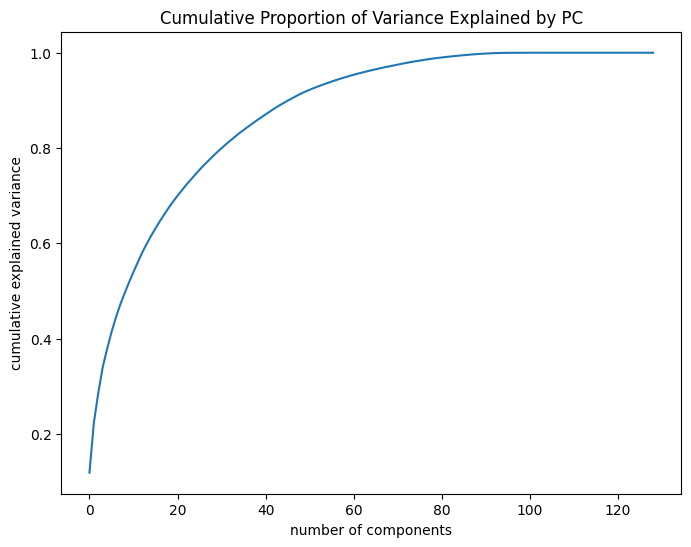

In [427]:
#Making the screeplot

fig = plt.figure(figsize = (8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Cumulative Proportion of Variance Explained by PC')
plt.show()

In [428]:
pca_explain_variance_x = {'PC-10':round(pca.explained_variance_ratio_[0:10].sum(),2),
                               'PC-20':round(pca.explained_variance_ratio_[0:20].sum(),2),
                               'PC-30':round(pca.explained_variance_ratio_[0:30].sum(),2),
                               'PC-40':round(pca.explained_variance_ratio_[0:40].sum(),2),
                               'PC-50':round(pca.explained_variance_ratio_[0:50].sum(),2),
                               'PC-60':round(pca.explained_variance_ratio_[0:60].sum(),2),
                               'PC-70':round(pca.explained_variance_ratio_[0:70].sum(),2),
                               'PC-80':round(pca.explained_variance_ratio_[0:80].sum(),2),
                               'PC-90':round(pca.explained_variance_ratio_[0:90].sum(),2)}
pca_explain_variance_x

{'PC-10': 0.52,
 'PC-20': 0.69,
 'PC-30': 0.79,
 'PC-40': 0.86,
 'PC-50': 0.92,
 'PC-60': 0.95,
 'PC-70': 0.97,
 'PC-80': 0.99,
 'PC-90': 1.0}

1. First 10 principal components explains 52% of the variance while 92% by first 50 principal components
2. From scree plot it is clear that the cumulative variance explanation curve flattens after 50.

In [429]:
#Visualizing the principal components
col = list(x.columns)
pca_df = pd.DataFrame({'PC1':pca.components_[0], 'PC2':pca.components_[1],'Feature':col})
pca_df.head(10)

,PC1,PC2,Feature
0,9.940788e-17,9.483225e-18,loc_og_t2o_mou
1,2.220446e-16,-1.110223e-16,std_og_t2o_mou
2,1.387779e-17,-4.440892e-16,loc_ic_t2o_mou
3,-3.397522e-02,2.033678e-01,arpu_8
4,-1.220380e-01,3.401887e-02,onnet_mou_6
5,-1.258573e-01,6.818451e-02,onnet_mou_7
6,-9.707414e-02,1.023934e-01,onnet_mou_8
7,-1.233635e-01,6.657158e-02,offnet_mou_6
8,-1.267025e-01,1.059903e-01,offnet_mou_7
9,-8.975007e-02,1.501217e-01,offnet_mou_8


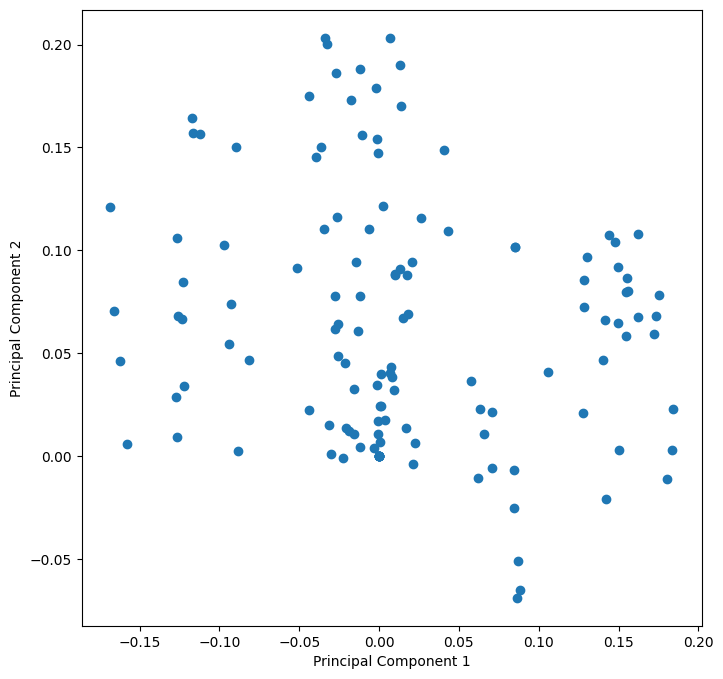

In [430]:
fig = plt.figure(figsize = (8,8))
plt.scatter(pca_df.PC1, pca_df.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [431]:
# Fitting the PCA
pca_final = IncrementalPCA(n_components = 50)

In [432]:
df_train_pca = pca_final.fit_transform(x_train)

In [433]:
# Checking multicollinearity - if there is correlation between PC's
corrmat = np.round(np.corrcoef(df_train_pca.transpose()),2)

<Axes: >

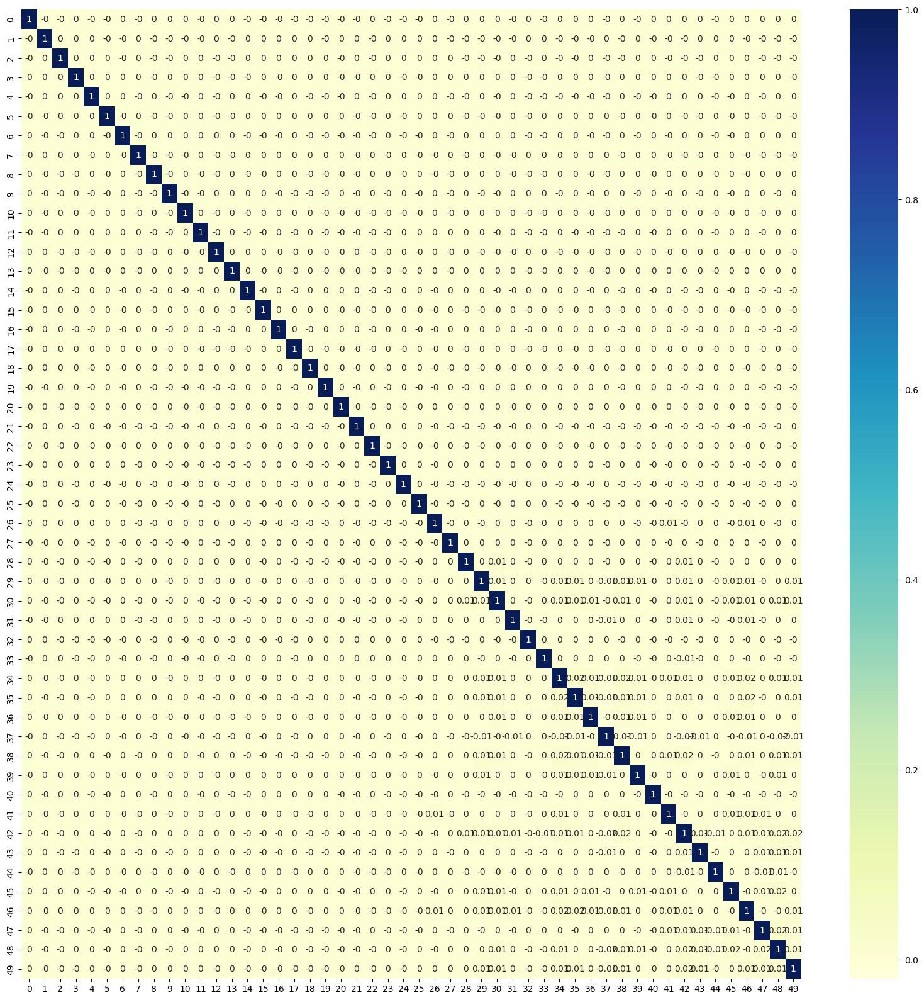

In [434]:
# Plot the correlation matrix
plt.figure(figsize = (20,20))
sns.heatmap(corrmat, annot= True, cmap="YlGnBu")

1. From the heat map it is clear that there is no sigficant correlation between the principal components
2. Hence there is no multi collinearity problem here for PC's

In [435]:
# Applying the PC's on test data
df_test_pca = pca_final.transform(x_test)

**Train a variety of models**

1. There are numerious ML models available in industry which are robust
2. Here we will go with Logistic Regression and Random Forest. The reason for chossing this is based on the problem statemtement and business need mentioned
--> Identify important variables that are strong predictors of churn
--> Predict whether a high-value customer will churn or not, in near future

**Logistic Regression**

In [436]:
# Logistic Regression
LR_with_PCA = LogisticRegression(random_state=RANDOM_STATE)
C=list(np.power(10.0, np.arange(-4, 4)))
n_folds = 5
gs = GridSearchCV(LR_with_PCA,
    param_grid=[{'C': C, 'penalty': ['l1', 'l2']}],
    cv= n_folds,
    scoring='accuracy',
    n_jobs= 1,
    verbose=1,
    refit=True,
    return_train_score = True)

In [437]:
# Fittng the Model
LR_with_PCA_model = gs.fit(df_train_pca, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [438]:
# cv results
cv_results = pd.DataFrame(LR_with_PCA_model.cv_results_)
cv_results.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'param_penalty', 'params', 'split0_test_score',
       'split1_test_score', 'split2_test_score', 'split3_test_score',
       'split4_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'split0_train_score', 'split1_train_score',
       'split2_train_score', 'split3_train_score', 'split4_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [439]:
# Getting the important columns out
cv_results_important = cv_results[['param_C', 'param_penalty',
                                   'mean_train_score','std_train_score',
                                   'mean_test_score','std_test_score',
                                   'rank_test_score']]
cv_results_important.sort_values('rank_test_score').head()

,param_C,param_penalty,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
7,0.1,l2,0.837359,0.001201,0.836403,0.006131,1
5,0.01,l2,0.837292,0.001446,0.836269,0.005806,2
11,10.0,l2,0.837265,0.001187,0.836242,0.006238,3
13,100.0,l2,0.837285,0.001203,0.836242,0.006238,3
15,1000.0,l2,0.837285,0.001203,0.836242,0.006238,3


1. Logistic regression model is simple and easy to execute
2. 'C' parameter is inverse of regularization strength. It does well for both l1 and l2 regularisations
3. Results suggests all features have importance as PCA was already performed

In [440]:
cv_results_l1 = cv_results[cv_results_important['param_penalty'] == 'l1']
cv_results_l2 = cv_results[cv_results_important['param_penalty'] == 'l2']

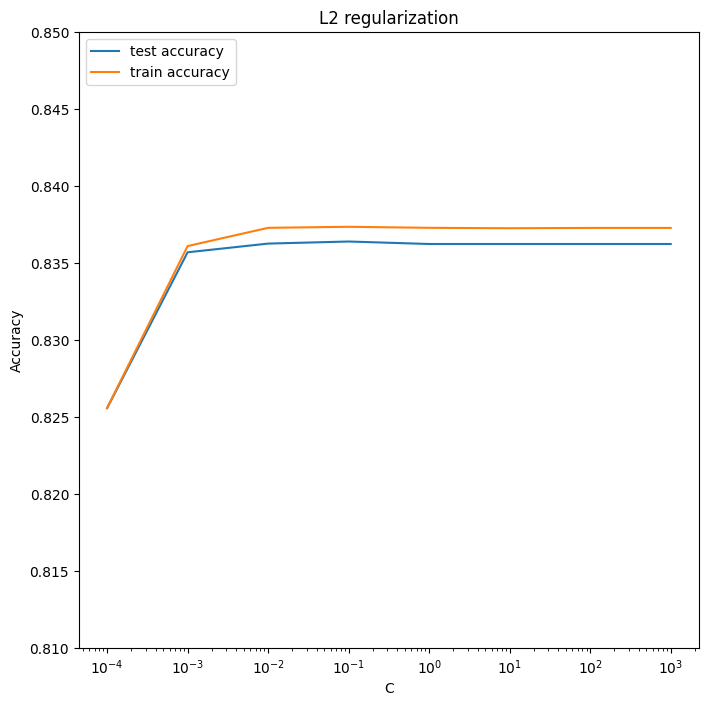

In [441]:
plt.figure(figsize=(8,8))
l2 = cv_results_l2

plt.plot(l2["param_C"], l2["mean_test_score"])
plt.plot(l2["param_C"], l2["mean_train_score"])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.title("L2 regularization")
plt.ylim([0.81, 0.85])
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

1. There is no impact of model performance by L1 Regularization
2. There is significant impact on performance by L2 Regularisation
3. Considering the model accuracy for test data set, the accuracy is high at c=1
4. L2 regularisation can be used with c =1

In [442]:
## Optimal scores
opt_score = LR_with_PCA_model.best_score_
opt_score.round(4)

0.8364

In [443]:
# Optimal params
opt_hyperparams = LR_with_PCA_model.best_params_
opt_hyperparams

{'C': 0.1, 'penalty': 'l2'}

In [444]:
# Fitting the model with best hyper parameters
# specifying optimal hyperparameters

# Optimal Model
LR = LogisticRegression(penalty = 'l2', C = 1.0, random_state=RANDOM_STATE)
LR_PCA_final = LR.fit(df_train_pca, y_train)

In [445]:
# Train and Test Accuracy
predict_prob_train = LR_PCA_final.predict_proba(df_train_pca)[:,1]
predict_prob_test = LR_PCA_final.predict_proba(df_test_pca)[:,1]

In [446]:
print("Train Data Accurancy = ",round(100*metrics.roc_auc_score(y_train, predict_prob_train),4))
print("Test Data Accurancy = ",round(100*metrics.roc_auc_score(y_test, predict_prob_test),4))

Train Data Accurancy =  90.9073
Test Data Accurancy =  89.6308


In [447]:
# Creating data frame with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'Churn':y_train, 'Churn_prob':predict_prob_train})

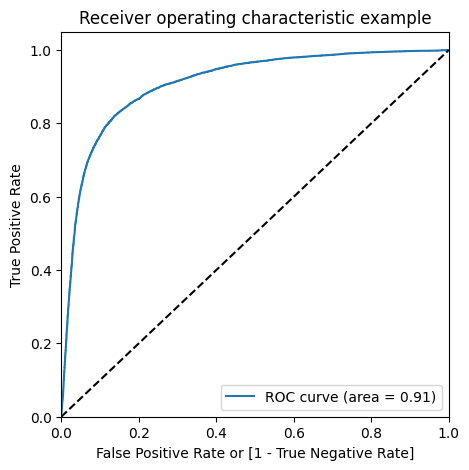

In [448]:
# Plotting ROC Curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

# Calling the function
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_prob)

1. The train and test data accuracy score is bit different
2. At P = 0.6 the model is stabilizing and hence the cut off value as 0.6

In [449]:
# Creating columns with different probability cutoffs
numbers = [float(x)/10 for x in range (10)]
for i in numbers:
    y_train_pred_final[i] = y_train_pred_final.Churn_prob.map(lambda x: 1 if x>i else 0)
y_train_pred_final.head()

,Churn,Churn_prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.879564,1,1,1,1,1,1,1,1,1,0
1,0,0.239435,1,1,1,0,0,0,0,0,0,0
2,0,0.054220,1,0,0,0,0,0,0,0,0,0
3,0,0.941239,1,1,1,1,1,1,1,1,1,1
4,0,0.003112,1,0,0,0,0,0,0,0,0,0


In [450]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensitivity','specificity'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy  sensitivity  specificity
0.0   0.0  0.500000     1.000000     0.000000
0.1   0.1  0.704880     0.976410     0.433349
0.2   0.2  0.763209     0.955297     0.571121
0.3   0.3  0.799079     0.924921     0.673237
0.4   0.4  0.825012     0.894975     0.755049
0.5   0.5  0.837103     0.855981     0.818226
0.6   0.6  0.840012     0.806915     0.873108
0.7   0.7  0.827570     0.742231     0.912910
0.8   0.8  0.788765     0.629558     0.947972
0.9   0.9  0.627188     0.270695     0.983681


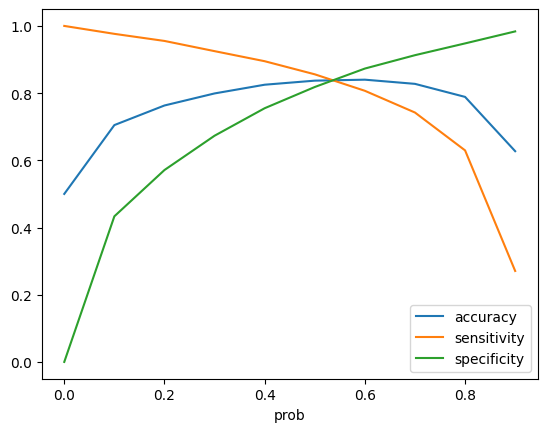

In [451]:
# Curve
cutoff_df.plot.line(x='prob',y=['accuracy','sensitivity','specificity'])
plt.show()

1. From ROC curve the optimal probability range is between 0.5 to 0.65
2. Accuracy, specificity and sensitivity curve converge at o.55
3. Hence we can take p = 0.55 for further predictions

In [452]:
y_train_pred_final['Final_Predict'] = y_train_pred_final.Churn_prob.map(lambda x: 1 if x>=0.55 else 0)

In [453]:
# Final DataFrame
finfr = list(y_train_pred_final.columns)
y_train_pred_final.drop(finfr[2:-1],axis = 1, inplace = True)
y_train_pred_final.head()

,Churn,Churn_prob,Final_Predict
0,1,0.879564,1
1,0,0.239435,0
2,0,0.054220,0
3,0,0.941239,1
4,0,0.003112,0


In [454]:
#### Metrics
Precision_sklearn = round(100*precision_score(y_train_pred_final.Churn, y_train_pred_final.Final_Predict),4)
Recall_sklearn = round(100*recall_score(y_train_pred_final.Churn, y_train_pred_final.Final_Predict),4)
Accuracy_sklearn = accuracy_score(y_train_pred_final.Churn,y_train_pred_final.Final_Predict)

print('Accuracy_sklearn',Precision_sklearn)
print('Precision_sklearn',Precision_sklearn)
print('Recall_sklearn',Recall_sklearn)

Accuracy_sklearn 84.5502
Precision_sklearn 84.5502
Recall_sklearn 83.3253


In [455]:
conf_matrix_2 = metrics.confusion_matrix(y_train_pred_final.Churn,y_train_pred_final.Final_Predict)
conf_matrix_2
TP = conf_matrix_2[1,1] # true positive
TN = conf_matrix_2[0,0] # true negatives
FP = conf_matrix_2[0,1] # false positives
FN = conf_matrix_2[1,0] # false negatives

In [456]:
# Check the accuracy of the model
Accuracy = round(100*(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.Final_Predict)),1)

# Measure the sensitivity
Sensitivity = round(100*TP/float(TP+FN))

# Measure specificity
Specificity = round(100*TN/float(TN+FP),1)

# Precision
Precision = round(100*TP/float(TP+FP))

# Recall
Recall = round(100*TP/float(TP+FN),1)

In [457]:
Metrics_train = {'Accuracy': Accuracy,
     'Precision': Precision,
     'Recall': Recall}

Metrics_train

{'Accuracy': 84.0, 'Precision': 85, 'Recall': 83.3}

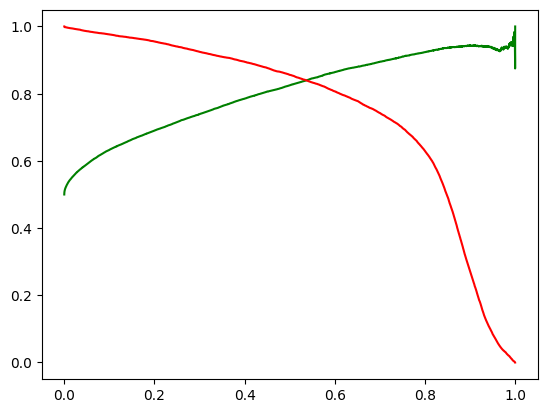

In [458]:
# Precision recall curve

p,r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_prob)
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

1. Recall and precision curve converge at 0.55
2. Since the goal is to predict as many true churns possible we can go with Recall values
3. This ensures there is lower false negatives and higher true positives

In [459]:
# Model performance on test data
df_test_pca[0:1]

array([[-2.20247577,  0.59901169, -1.92279143, -0.68974414, -2.53929781,
        -0.76480715,  1.31444253, -1.31288782,  0.45105949,  1.03282276,
        -2.14522185,  1.38980411, -1.05395002,  0.60152917,  0.08446596,
         0.015521  ,  0.2266945 , -0.05381445,  0.64997808,  0.8548723 ,
         0.39130267, -0.13967085, -0.17886744, -0.01865062,  0.22916047,
        -0.03415807,  0.1486227 , -0.10216194, -0.37592698,  0.30466893,
         0.09188943,  0.01567206,  0.56462582, -0.1876016 ,  0.44908128,
        -0.08027734, -0.68110866, -0.7650407 , -1.11142696, -0.67292176,
        -0.05741183,  0.22822716, -0.10763322,  0.44656794, -0.16613868,
         0.18082189, -0.18278391, -0.38972106,  0.17408168, -0.18995203]])

In [460]:
# Test Result Dataframe
# Predict the y test values
y_test_pred = LR_PCA_final.predict(df_test_pca)

# Convert y_pred to a data frame which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# View the dataframe
y_pred_1.head()

,0
0,0
1,0
2,0
3,1
4,0


In [461]:
# Convert y_test to a Dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.reset_index(inplace = True)

In [462]:
# Append y_pred_1 and y_test_df
y_pred_final = pd.concat([y_test_df,y_pred_1], axis=1)
y_pred_final.head()

,mobile_number,churn,0
0,7000414430,0,0
1,7000189484,0,0
2,7000710112,0,0
3,7000843290,0,1
4,7001318860,0,0


In [463]:
# Rename the column
y_pred_final = y_pred_final.rename(columns={0 :'Churn_Predict'})
y_pred_final.head()

,mobile_number,churn,Churn_Predict
0,7000414430,0,0
1,7000189484,0,0
2,7000710112,0,0
3,7000843290,0,1
4,7001318860,0,0


In [464]:
y_pred_final['Final_pred'] = y_pred_final.Churn_Predict.map(lambda x: 1 if x >= 0.55 else 0 )
y_pred_final.head()

,mobile_number,churn,Churn_Predict,Final_pred
0,7000414430,0,0,0
1,7000189484,0,0,0
2,7000710112,0,0,0
3,7000843290,0,1,1
4,7001318860,0,0,0


In [465]:
# Confusion Matrix - Test
conf_matrix_3 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.Churn_Predict)
conf_matrix_3

array([[6498, 1426],
       [ 117,  596]])

In [466]:
# Confusion Matrix - Test
TP = conf_matrix_3[1,1] # true positive
TN = conf_matrix_3[0,0] # true negatives
FP = conf_matrix_3[0,1] # false positives
FN = conf_matrix_3[1,0] # false negatives

# Check the accuracy of the model
Accuracy = round(100*(metrics.accuracy_score(y_pred_final.churn, y_pred_final.Final_pred)),1)

# Measure the sensitivity
Sensitivity = round(100*TP/float(TP+FN))

# Measure specificity
Specificity = round(100*TN/float(TN+FP),1)


# Precision
Precision = round(100*TP/float(TP+FP))

# Recall
Recall = round(100*TP/float(TP+FN),1)


In [467]:
Metrics_test = {'Accuracy': Accuracy,
     'Precision': Precision,
     'Recall': Recall}
print('Test Metrics:', Metrics_test)
print('Train Metrics', Metrics_train)

Test Metrics: {'Accuracy': 82.1, 'Precision': 29, 'Recall': 83.6}
Train Metrics {'Accuracy': 84.0, 'Precision': 85, 'Recall': 83.3}


1. Accuracy seem to be fine but precision and recall values seem okay
2. Logistic regression model results are not okay but need to check the results for Random forest as well

**Random Forest**

In [468]:
# Creating the parameter grid
param_grid = {
    'max_depth': [1,7,15],
    'min_samples_leaf': range(15, 50, 5),
    'min_samples_split': range(20, 40, 5),
    'n_estimators': [15],
    'max_features': [10, 20, 5]
}

rf = RandomForestClassifier(random_state=RANDOM_STATE)
# run the grid search
grid_search = GridSearchCV(rf, param_grid=param_grid,
                          cv= 3, n_jobs=-1,
                          verbose=1,
                          return_train_score = True)

In [469]:
# Fitting the model to our data
rf_model = grid_search.fit(df_train_pca, y_train)

Fitting 3 folds for each of 252 candidates, totalling 756 fits


In [475]:
# cv results
cv_results_rf = pd.DataFrame(rf_model.cv_results_)
cv_results_rf.columns

Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_max_depth', 'param_max_features', 'param_min_samples_leaf',
       'param_min_samples_split', 'param_n_estimators', 'params',
       'split0_test_score', 'split1_test_score', 'split2_test_score',
       'mean_test_score', 'std_test_score', 'rank_test_score',
       'split0_train_score', 'split1_train_score', 'split2_train_score',
       'mean_train_score', 'std_train_score'],
      dtype='object')

In [476]:
# Getting the important columns out
cv_results_important_rf = cv_results_rf[['param_max_depth', 'param_max_features','param_min_samples_leaf',
                                   'param_min_samples_split','param_n_estimators',
                                   'mean_train_score','std_train_score',
                                   'mean_test_score','std_test_score',
                                   'rank_test_score']]
cv_results_important_rf.sort_values('rank_test_score').head(5)

,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,mean_train_score,std_train_score,mean_test_score,std_test_score,rank_test_score
196,15,20,15,20,15,0.936393,0.001835,0.902165,0.002126,1
197,15,20,15,25,15,0.936393,0.001835,0.902165,0.002126,1
198,15,20,15,30,15,0.936393,0.001835,0.902165,0.002126,1
199,15,20,15,35,15,0.932420,0.002114,0.900172,0.001807,4
171,15,10,15,35,15,0.928852,0.001377,0.896591,0.002094,5


In [477]:
cv_results_important_rf.to_csv("cv_results_rf.csv")

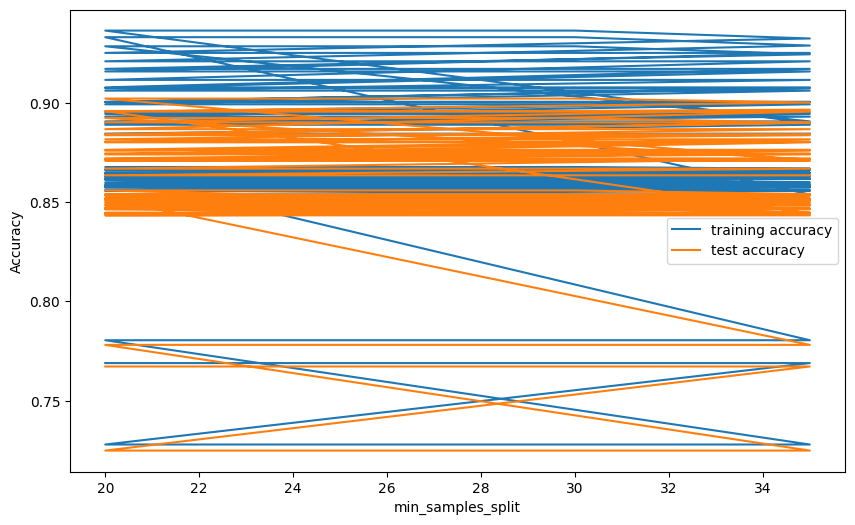

In [478]:
# plotting accuracies with min_samples_split
plt.figure(figsize=(10,6))

plt.plot(cv_results_important_rf["param_min_samples_split"],
         cv_results_important_rf["mean_train_score"],
         label="training accuracy")
plt.plot(cv_results_important_rf["param_min_samples_split"],
         cv_results_important_rf["mean_test_score"],
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()

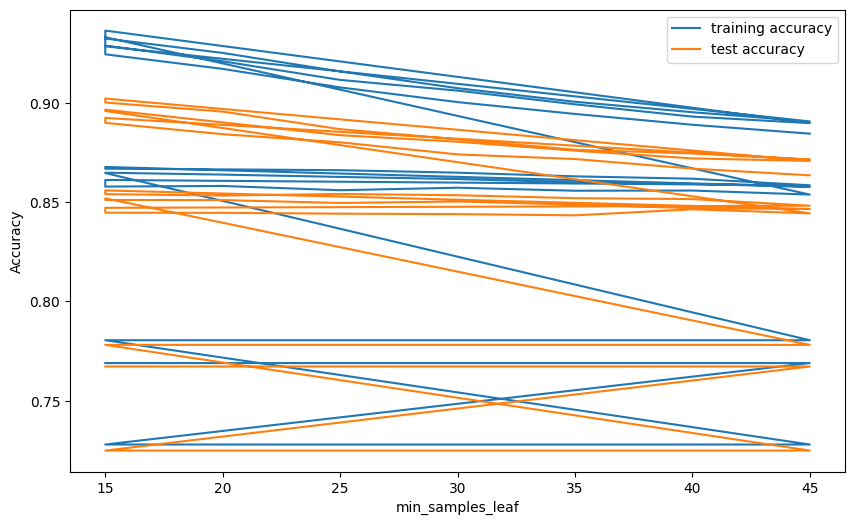

In [479]:
plt.figure(figsize=(10,6))
plt.plot(cv_results_important_rf["param_min_samples_leaf"],
         cv_results_important_rf["mean_train_score"],
         label="training accuracy")
plt.plot(cv_results_important_rf["param_min_samples_leaf"],
         cv_results_important_rf["mean_test_score"],
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()

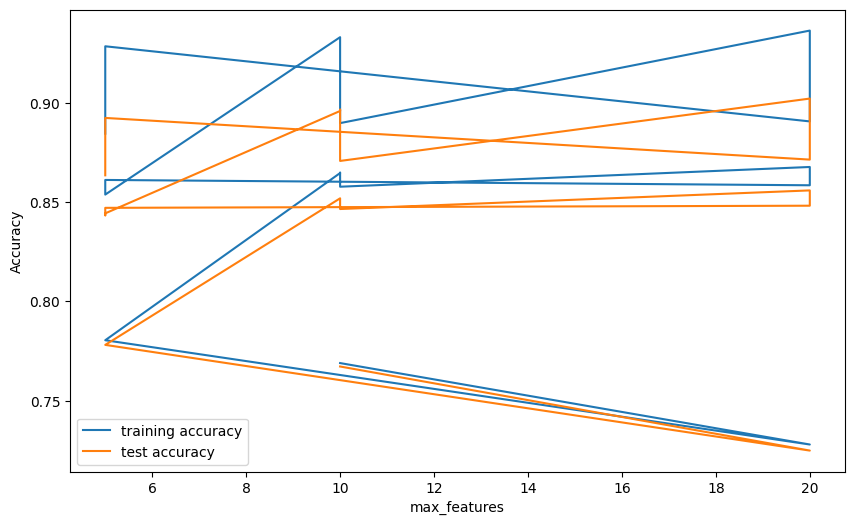

In [480]:
plt.figure(figsize=(10,6))
plt.plot(cv_results_important_rf["param_max_features"],
         cv_results_important_rf["mean_train_score"],
         label="training accuracy")
plt.plot(cv_results_important_rf["param_max_features"],
         cv_results_important_rf["mean_test_score"],
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()

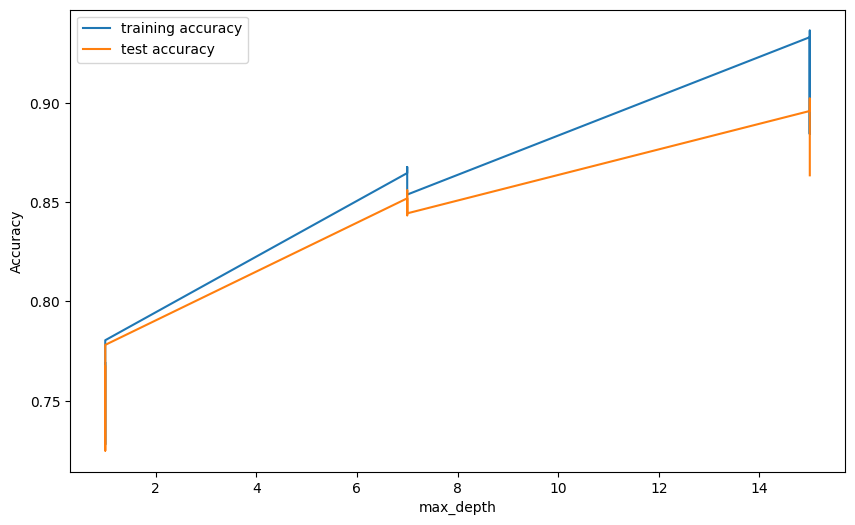

In [481]:
plt.figure(figsize=(10,6))
plt.plot(cv_results_important_rf["param_max_depth"],
         cv_results_important_rf["mean_train_score"],
         label="training accuracy")
plt.plot(cv_results_important_rf["param_max_depth"],
         cv_results_important_rf["mean_test_score"],
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()

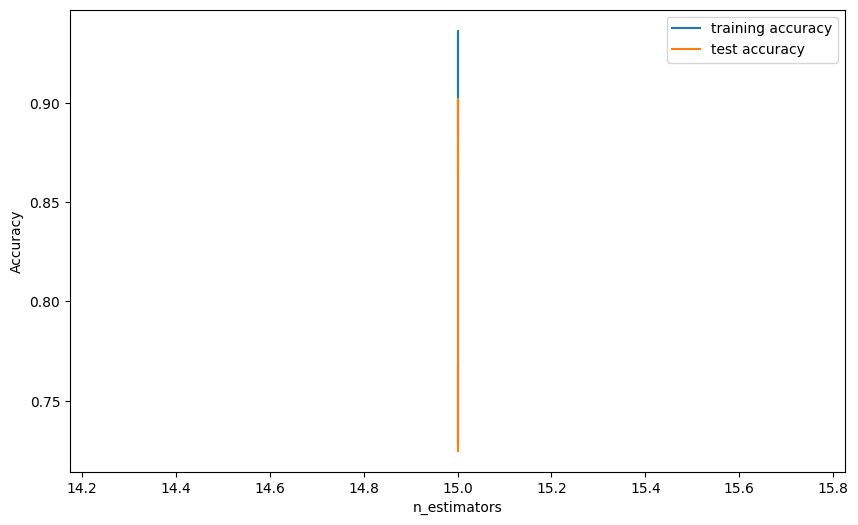

In [482]:
plt.figure(figsize=(10,6))
plt.plot(cv_results_important_rf["param_n_estimators"],
         cv_results_important_rf["mean_train_score"],
         label="training accuracy")
plt.plot(cv_results_important_rf["param_n_estimators"],
         cv_results_important_rf["mean_test_score"],
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()

1. As max depth increases the score also increases
2. Other hyper parameters does not affect the scores significantly and cannot come to a final conclusion

In [483]:
# optimal accuracy score and hyperparameters
opt_score = rf_model.best_score_
opt_hyperparams = rf_model.best_params_

print("Optimal Test Score {0} corresponding to hyperparameters {1}".format(opt_score, opt_hyperparams))

Optimal Test Score 0.902165131685248 corresponding to hyperparameters {'max_depth': 15, 'max_features': 20, 'min_samples_leaf': 15, 'min_samples_split': 20, 'n_estimators': 15}


In [484]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=15,
                             min_samples_leaf=15,
                             min_samples_split=20,
                             max_features=20,
                             n_estimators=15)

In [485]:
# fitting the data
rfc.fit(df_train_pca,y_train)

RandomForestClassifier(max_depth=15, max_features=20, min_samples_leaf=15,
                       min_samples_split=20, n_estimators=15)

In [486]:
# Predictng the results on x_train
predict_train = rfc.predict(df_train_pca)

# Predicting the results on x_test
predict_test = rfc.predict(df_test_pca)

In [487]:
# Checking results for train data
print(classification_report(y_train, predict_train))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94     18567
           1       0.93      0.96      0.94     18567

    accuracy                           0.94     37134
   macro avg       0.94      0.94      0.94     37134
weighted avg       0.94      0.94      0.94     37134



In [488]:
# Checking results for test data
print(classification_report(y_test, predict_test))

              precision    recall  f1-score   support

           0       0.97      0.91      0.94      7924
           1       0.41      0.71      0.52       713

    accuracy                           0.89      8637
   macro avg       0.69      0.81      0.73      8637
weighted avg       0.93      0.89      0.90      8637



1. Train data accuracy, precision and recall values are exceptionally good
2. Test data accuracy precision and recall are decent though great

In [490]:
# Print confusion matrix
# Train Data
conf_matrix_train = confusion_matrix(y_train,predict_train)
# Test Data
conf_marix_test = confusion_matrix(y_test,predict_test)

In [491]:
# Train Data
TP = conf_mat_train[1,1] # true positive
TN = conf_mat_train[0,0] # true negatives
FP = conf_mat_train[0,1] # false positives
FN = conf_mat_train[1,0] # false negatives

# Check the accuracy of the model
Accuracy = round(100*(metrics.accuracy_score(y_train, predict_train)),1)

# Measure the sensitivity
Sensitivity = round(100*TP/float(TP+FN))

# Measure specificity
Specificity = round(100*TN/float(TN+FP),1)


# Precision
Precision = round(100*TP/float(TP+FP))

# Recall
Recall = round(100*TP/float(TP+FN),1)


In [492]:
Metrics_train = {'Accuracy': Accuracy,
     'Precision': Precision,
     'Recall': Recall}

Metrics_train

{'Accuracy': 94.4, 'Precision': 93, 'Recall': 95.8}

In [493]:
# Train Data
TP = conf_mat_test[1,1] # true positive
TN = conf_mat_test[0,0] # true negatives
FP = conf_mat_test[0,1] # false positives
FN = conf_mat_test[1,0] # false negatives

# Check the accuracy of the model
Accuracy = round(100*(metrics.accuracy_score(y_test, predict_test)),1)

# Measure the sensitivity
Sensitivity = round(100*TP/float(TP+FN))

# Measure specificity
Specificity = round(100*TN/float(TN+FP),1)


# Precision
Precision = round(100*TP/float(TP+FP))

# Recall
Recall = round(100*TP/float(TP+FN),1)


In [494]:
Metrics_test = {'Accuracy': Accuracy,
     'Precision': Precision,
     'Recall': Recall}

In [495]:
print(Metrics_train)
print(Metrics_test)

{'Accuracy': 94.4, 'Precision': 93, 'Recall': 95.8}
{'Accuracy': 89.1, 'Precision': 41, 'Recall': 70.5}


**CONCLUSION**
1. Comparing the results for logistics regression and random forest we can go with logistic regresion with PCA as the recall scores are better
2. Recall helps to increase the chance of true positives and lower fasle negatives

**Find the best predictort**

In [496]:
# Response variable
y_2 = telecom_model['churn']
# Feature variable
x_2 = telecom_model.drop('churn', axis=1)

In [499]:
# Split the data between train and test
x_train_2, x_test_2, y_train_2, y_test_2 = train_test_split(x_2, y_2, train_size = 0.7, test_size = 0.3, random_state = RANDOM_STATE)

In [500]:
# Balancing - smote
list_column_names = list(x_2.columns)
smote_2 = SMOTE()
x_train_2, y_train_2 = smote_2.fit_resample(x_train_2, y_train_2)

In [501]:
print('Churn % after smote')
print((y_train_2 != 0).sum()/(y_train_2 == 0).sum())

Churn % after smote
1.0


In [508]:
scaler = StandardScaler()
x_train_2 = scaler.fit_transform(x_train_2)
x_test_2 = scaler.transform(x_test_2)
df_train_2 = pd.DataFrame(x_train_2, columns = list_column_names)

**Using RFE to find the features**

In [513]:
logreg = LogisticRegression()
rfe = RFE(logreg)
rfe.fit(df_train_2, y_train_2)
print(rfe.support_)

[False False False  True  True False  True  True  True  True False False
  True  True False False False False False  True False False False False
 False False False  True  True False  True False  True  True  True False
  True  True  True  True  True  True  True  True  True False False  True
  True  True  True  True  True False  True False False  True False  True
 False False  True False False  True False  True  True False  True  True
  True False False False False False False False False False  True  True
  True  True  True False False  True  True  True  True  True  True False
 False False False  True False  True False False False False False False
  True  True  True False  True False  True False False  True  True  True
 False  True False False False  True False False  True]


In [514]:
# Variables from RFE
col = df_train_2.columns[rfe.support_]

In [515]:
#1 Assessing the model with stats model
import statsmodels.api as sm
x_train_sm = sm.add_constant(df_train_2[col])
logm1 = sm.GLM(y_train_2, x_train_sm, family=sm.families.Binomial())
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37134
Model:                            GLM   Df Residuals:                    37069
Model Family:                Binomial   Df Model:                           64
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9945.6
Date:                Sun, 12 Nov 2023   Deviance:                       19891.
Time:                        06:15:00   Pearson chi2:                 1.22e+06
No. Iterations:                   100   Pseudo R-squ. (CS):             0.5729
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     1.176e+04   9.65e+04      0.122      0.903   -1.77e+05    2.01e+05
arpu_8                       0.4776      0.056      8.509      0.000       0.368       0.588
onnet_mou_6                 -0.4616      0.196     -2.358      0.018      -0.845      -0.078
onnet_mou_8                 -0.4613      0.039    -11.727      0.000      -0.538      -0.384
offnet_mou_6                -0.5275      0.206     -2.562      0.010      -0.931      -0.124
offnet_mou_7                 0.2548      0.057      4.469      0.000       0.143       0.367
offnet_mou_8                -0.6149      0.045    -13.598      0.000      -0.704      -0.526
loc_og_t2t_mou_8            -0.2650      0.069     -3.817      0.000      -0.401      -0.129
loc_og_t2m_mou_8            -0.4620      0.063     -7.287      0.000      -0.586      -0.338
loc_og_mou_7                 0.2081      0.297      0.701      0.483      -0.374       0.790
std_og_mou_6                 0.2832      0.098      2.898      0.004       0.092       0.475
std_og_mou_7                 0.3637      0.600      0.606      0.545      -0.813       1.540
isd_og_mou_8                -0.2042      0.040     -5.150      0.000      -0.282      -0.126
og_others_8                 -3.1466      1.910     -1.647      0.099      -6.890       0.597
total_og_mou_6               0.4619      0.301      1.535      0.125      -0.128       1.052
total_og_mou_7              -0.3219      0.650     -0.495      0.621      -1.597       0.953
loc_ic_t2t_mou_8          7698.8979    432.811     17.788      0.000    6850.603    8547.193
loc_ic_t2m_mou_8          1.114e+04    626.151     17.787      0.000    9910.211    1.24e+04
loc_ic_t2f_mou_8          2080.4712    116.970     17.786      0.000    1851.214    2309.728
loc_ic_mou_6             -5287.7644    639.851     -8.264      0.000   -6541.850   -4033.679
loc_ic_mou_7             -4900.4868    593.184     -8.261      0.000   -6063.107   -3737.867
loc_ic_mou_8             -1.591e+04    894.241    -17.789      0.000   -1.77e+04   -1.42e+04
std_ic_t2t_mou_8          1411.8187    268.599      5.256      0.000     885.374    1938.263
std_ic_t2m_mou_8          2108.3067    401.001      5.258      0.000    1322.359    2894.255
std_ic_t2f_mou_8           379.9472     72.295      5.255      0.000     238.251     521.644
std_ic_mou_7                 0.6127      0.152      4.037      0.000       0.315       0.910
std_ic_mou_8             -2816.0752    535.633     -5.257      0.000   -3865.896   -1766.254
total_ic_mou_6               1.1924      0.176      6.767      0.000       0.847       1.538
total_ic_mou_7              -0.4699      0.225     -2.088      0.037      -0.911      -0.029
total_ic_mou_8              -0.9149      0.261     -3.502      0.000      -1.427      -0.403
spl_ic_mou_8  

In [516]:
x_train_sm.columns

Index(['const', 'arpu_8', 'onnet_mou_6', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8',
       'loc_og_mou_7', 'std_og_mou_6', 'std_og_mou_7', 'isd_og_mou_8',
       'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7',
       'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8',
       'std_ic_t2f_mou_8', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6',
       'total_ic_mou_7', 'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8',
       'total_rech_num_8', 'max_rech_amt_8', 'last_day_rch_amt_8',
       'max_rech_data_8', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_7', 'count_rech_3g_8', 'vol_2g_mb_8', 'night_pck_user_8',
       'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8',
       'fb_user_8', 'aon', 'vbc_3g_8', 'total_rech_amt_data_6',
       'total_rech_amt_data_7', 'total_rech_amt_data_8', 'arpu_

In [517]:
# Check VIF values
vif = pd.DataFrame()
x = x_train_sm
vif['Features'] = x.columns
vif['VIF'] = [variance_inflation_factor(x_train_sm.values, i) for i in range(x_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by='VIF', ascending=False)
vif

,Features,VIF
21,loc_ic_mou_8,2.302188e+09
55,loc_ic_t2m_mou_goodphase,1.956018e+09
19,loc_ic_mou_6,1.212431e+09
17,loc_ic_t2m_mou_8,1.128705e+09
20,loc_ic_mou_7,1.042019e+09
56,loc_ic_t2t_mou_goodphase,8.927842e+08
26,std_ic_mou_8,7.743958e+08
16,loc_ic_t2t_mou_8,5.392917e+08
23,std_ic_t2m_mou_8,4.340283e+08
22,std_ic_t2t_mou_8,1.947210e+08


In [518]:
# 2
x_train_sm.columns

Index(['const', 'arpu_8', 'onnet_mou_6', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8',
       'loc_og_mou_7', 'std_og_mou_6', 'std_og_mou_7', 'isd_og_mou_8',
       'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7',
       'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8',
       'std_ic_t2f_mou_8', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6',
       'total_ic_mou_7', 'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8',
       'total_rech_num_8', 'max_rech_amt_8', 'last_day_rch_amt_8',
       'max_rech_data_8', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_7', 'count_rech_3g_8', 'vol_2g_mb_8', 'night_pck_user_8',
       'monthly_2g_8', 'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8',
       'fb_user_8', 'aon', 'vbc_3g_8', 'total_rech_amt_data_6',
       'total_rech_amt_data_7', 'total_rech_amt_data_8', 'arpu_

In [519]:
#2 Assessing the model with stats model
import statsmodels.api as sm
logm2 = sm.GLM(y_train_2, x_train_sm, family=sm.families.Binomial())
res2 = logm2.fit()
res2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37134
Model:                            GLM   Df Residuals:                    37069
Model Family:                Binomial   Df Model:                           64
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9945.6
Date:                Sun, 12 Nov 2023   Deviance:                       19891.
Time:                        06:16:22   Pearson chi2:                 1.22e+06
No. Iterations:                   100   Pseudo R-squ. (CS):             0.5729
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     1.176e+04   9.65e+04      0.122      0.903   -1.77e+05    2.01e+05
arpu_8                       0.4776      0.056      8.509      0.000       0.368       0.588
onnet_mou_6                 -0.4616      0.196     -2.358      0.018      -0.845      -0.078
onnet_mou_8                 -0.4613      0.039    -11.727      0.000      -0.538      -0.384
offnet_mou_6                -0.5275      0.206     -2.562      0.010      -0.931      -0.124
offnet_mou_7                 0.2548      0.057      4.469      0.000       0.143       0.367
offnet_mou_8                -0.6149      0.045    -13.598      0.000      -0.704      -0.526
loc_og_t2t_mou_8            -0.2650      0.069     -3.817      0.000      -0.401      -0.129
loc_og_t2m_mou_8            -0.4620      0.063     -7.287      0.000      -0.586      -0.338
loc_og_mou_7                 0.2081      0.297      0.701      0.483      -0.374       0.790
std_og_mou_6                 0.2832      0.098      2.898      0.004       0.092       0.475
std_og_mou_7                 0.3637      0.600      0.606      0.545      -0.813       1.540
isd_og_mou_8                -0.2042      0.040     -5.150      0.000      -0.282      -0.126
og_others_8                 -3.1466      1.910     -1.647      0.099      -6.890       0.597
total_og_mou_6               0.4619      0.301      1.535      0.125      -0.128       1.052
total_og_mou_7              -0.3219      0.650     -0.495      0.621      -1.597       0.953
loc_ic_t2t_mou_8          7698.8979    432.811     17.788      0.000    6850.603    8547.193
loc_ic_t2m_mou_8          1.114e+04    626.151     17.787      0.000    9910.211    1.24e+04
loc_ic_t2f_mou_8          2080.4712    116.970     17.786      0.000    1851.214    2309.728
loc_ic_mou_6             -5287.7644    639.851     -8.264      0.000   -6541.850   -4033.679
loc_ic_mou_7             -4900.4868    593.184     -8.261      0.000   -6063.107   -3737.867
loc_ic_mou_8             -1.591e+04    894.241    -17.789      0.000   -1.77e+04   -1.42e+04
std_ic_t2t_mou_8          1411.8187    268.599      5.256      0.000     885.374    1938.263
std_ic_t2m_mou_8          2108.3067    401.001      5.258      0.000    1322.359    2894.255
std_ic_t2f_mou_8           379.9472     72.295      5.255      0.000     238.251     521.644
std_ic_mou_7                 0.6127      0.152      4.037      0.000       0.315       0.910
std_ic_mou_8             -2816.0752    535.633     -5.257      0.000   -3865.896   -1766.254
total_ic_mou_6               1.1924      0.176      6.767      0.000       0.847       1.538
total_ic_mou_7              -0.4699      0.225     -2.088      0.037      -0.911      -0.029
total_ic_mou_8              -0.9149      0.261     -3.502      0.000      -1.427      -0.403
spl_ic_mou_8  

In [520]:
# Check VIF values
vif = pd.DataFrame()
x = x_train_sm
vif['Features'] = x.columns
vif['VIF'] = [variance_inflation_factor(x_train_sm.values, i) for i in range(x_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by='VIF', ascending=False)
vif

,Features,VIF
21,loc_ic_mou_8,2.302188e+09
55,loc_ic_t2m_mou_goodphase,1.956018e+09
19,loc_ic_mou_6,1.212431e+09
17,loc_ic_t2m_mou_8,1.128705e+09
20,loc_ic_mou_7,1.042019e+09
56,loc_ic_t2t_mou_goodphase,8.927842e+08
26,std_ic_mou_8,7.743958e+08
16,loc_ic_t2t_mou_8,5.392917e+08
23,std_ic_t2m_mou_8,4.340283e+08
22,std_ic_t2t_mou_8,1.947210e+08


In [521]:
## Drop Columns
x_train_sm.drop(['loc_ic_mou_8'], axis = 1, inplace = True)

In [522]:
# 3
x_train_sm.columns

Index(['const', 'arpu_8', 'onnet_mou_6', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8',
       'loc_og_mou_7', 'std_og_mou_6', 'std_og_mou_7', 'isd_og_mou_8',
       'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8',
       'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7',
       'total_ic_mou_8', 'spl_ic_mou_8', 'ic_others_8', 'total_rech_num_8',
       'max_rech_amt_8', 'last_day_rch_amt_8', 'max_rech_data_8',
       'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_7',
       'count_rech_3g_8', 'vol_2g_mb_8', 'night_pck_user_8', 'monthly_2g_8',
       'sachet_2g_8', 'monthly_3g_8', 'sachet_3g_8', 'fb_user_8', 'aon',
       'vbc_3g_8', 'total_rech_amt_data_6', 'total_rech_amt_data_7',
       'total_rech_amt_data_8', 'arpu_goodphase', 'mon

In [523]:
# Assess the model with stats model
import statsmodels.api as sm
logm3 = sm.GLM(y_train_2, x_train_sm, family=sm.families.Binomial())
res3 = logm3.fit()
res3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                37134
Model:                            GLM   Df Residuals:                    37070
Model Family:                Binomial   Df Model:                           63
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -10104.
Date:                Sun, 12 Nov 2023   Deviance:                       20208.
Time:                        06:17:50   Pearson chi2:                 3.55e+06
No. Iterations:                   100   Pseudo R-squ. (CS):             0.5692
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     1.177e+04   9.65e+04      0.122      0.903   -1.77e+05    2.01e+05
arpu_8                       0.4483      0.056      7.997      0.000       0.338       0.558
onnet_mou_6                 -0.6176      0.194     -3.181      0.001      -0.998      -0.237
onnet_mou_8                 -0.4936      0.039    -12.513      0.000      -0.571      -0.416
offnet_mou_6                -0.6936      0.204     -3.395      0.001      -1.094      -0.293
offnet_mou_7                 0.2151      0.057      3.807      0.000       0.104       0.326
offnet_mou_8                -0.6306      0.045    -13.906      0.000      -0.719      -0.542
loc_og_t2t_mou_8            -0.2668      0.071     -3.755      0.000      -0.406      -0.128
loc_og_t2m_mou_8            -0.5068      0.065     -7.855      0.000      -0.633      -0.380
loc_og_mou_7                 0.3802      0.310      1.228      0.219      -0.226       0.987
std_og_mou_6                 0.3065      0.097      3.162      0.002       0.117       0.496
std_og_mou_7                 0.7259      0.626      1.160      0.246      -0.501       1.953
isd_og_mou_8                -0.1995      0.040     -5.008      0.000      -0.278      -0.121
og_others_8                 -3.1833      2.019     -1.577      0.115      -7.140       0.774
total_og_mou_6               0.6939      0.299      2.323      0.020       0.108       1.280
total_og_mou_7              -0.6972      0.678     -1.028      0.304      -2.027       0.632
loc_ic_t2t_mou_8            -0.2435      0.138     -1.759      0.079      -0.515       0.028
loc_ic_t2m_mou_8            -0.9600      0.184     -5.220      0.000      -1.321      -0.600
loc_ic_t2f_mou_8            -0.2861      0.070     -4.105      0.000      -0.423      -0.149
loc_ic_mou_6             -7498.4828    626.230    -11.974      0.000   -8725.872   -6271.094
loc_ic_mou_7             -6949.9407    580.556    -11.971      0.000   -8087.810   -5812.072
std_ic_t2t_mou_8          1803.1217    269.805      6.683      0.000    1274.314    2331.930
std_ic_t2m_mou_8          2692.5468    402.801      6.685      0.000    1903.071    3482.022
std_ic_t2f_mou_8           485.2581     72.620      6.682      0.000     342.925     627.591
std_ic_mou_7                 0.6532      0.153      4.268      0.000       0.353       0.953
std_ic_mou_8             -3596.4692    538.037     -6.684      0.000   -4651.002   -2541.937
total_ic_mou_6               1.2457      0.178      7.007      0.000       0.897       1.594
total_ic_mou_7              -0.4890      0.225     -2.175      0.030      -0.930      -0.048
total_ic_mou_8              -1.0120      0.273     -3.707      0.000      -1.547      -0.477
spl_ic_mou_8                -0.2524      0.026     -9.826      0.000      -0.303      -0.202
ic_others_8   

In [524]:
# Check VIF values
vif = pd.DataFrame()
x = x_train_sm
vif['Features'] = x.columns
vif['VIF'] = [variance_inflation_factor(x_train_sm.values, i) for i in range(x_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by='VIF', ascending=False)
vif

,Features,VIF
54,loc_ic_t2m_mou_goodphase,1.862395e+09
19,loc_ic_mou_6,1.154398e+09
20,loc_ic_mou_7,9.921430e+08
55,loc_ic_t2t_mou_goodphase,8.500520e+08
25,std_ic_mou_8,7.648458e+08
22,std_ic_t2m_mou_8,4.286757e+08
21,std_ic_t2t_mou_8,1.923196e+08
53,loc_ic_t2f_mou_goodphase,7.097064e+07
23,std_ic_t2f_mou_8,1.393269e+07
15,total_og_mou_7,1.350350e+03


In [ ]:
x_train_sm.columns

In [ ]:
# Assess the model with stats model
import statsmodels.api as sm
logm4 = sm.GLM(y_train_2, x_train_sm, family=sm.families.Binomial())
res4 = logm4.fit()
res4.summary()

In [ ]:
# Check VIF values
vif = pd.DataFrame()
x = x_train_sm
vif['Features'] = x.columns
vif['VIF'] = [variance_inflation_factor(x_train_sm.values, i) for i in range(x_train_sm.shape[1])]
vif['VIF'] = round(vif['VIF'],2)
vif = vif.sort_values(by='VIF', ascending=False)
vif

In [ ]:
contribution = 100*res4.params.sort_values(ascending = False)/sum(abs(res4.params.values))
contribution

The top Features are as follows
1. loc_ic_t2m_mou_8
2. loc_ic_t2t_mou_8
3. total_ic_mou_8
4. last_day_rch_amt_8
5. fb_user_8
6. loc_ic_mou_7
7. arpu_goodphase
8. total_ic_mou_6
9. roam_og_mou_8
10. loc_og_t2t_mou_goodphase

MOU (Minutes of Usage) seem to be major predictor of churn

Action phase data tells more about the churn

**CONCLUSION**

The company can offer data+call plans upgrade offer as minutes of usage comes out to be strong predictor of churn. Since outgoing calls within the same network is one of the strong predictor the company can introduce schemes or offers like night time free or lower call rate for T2T calls, extra talk time or free talk time hours for t2t calls etc. Also, can ensure the customer service team functions effectively when the number of recharge drops and provide some pesonalized plans to boost the customer satisfaction.